In [449]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

from ydata_profiling import ProfileReport
from yellowbrick.cluster import SilhouetteVisualizer, KElbowVisualizer

# scipy requirements 
from scipy.stats.mstats import winsorize
from scipy.cluster.hierarchy import dendrogram, ward
from scipy.cluster import hierarchy

# sklearn requirements 
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split, GroupShuffleSplit
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_regression
from sklearn.cluster import KMeans

# Set Matplotlib defaults
%matplotlib inline
plt.rc('figure', autolayout=True)
plt.rc('axes', labelweight='bold', labelsize='large', titleweight='bold', titlesize=18, titlepad=10)
plt.rc('animation', html='html5')

# Set seaborn defaults
sns.set_style(style='darkgrid')
sns.set_palette(palette='pastel')
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.set()

warnings.filterwarnings('ignore')

# Load the dataset
df = pd.read_csv('mental-heath-in-tech-2016_20161114.csv')

# **1. Explore the data**

In [451]:
df.shape

(1433, 63)

In [452]:
df.head()

,Are you self-employed?,How many employees does your company or organization have?,Is your employer primarily a tech company/organization?,Is your primary role within your company related to tech/IT?,Does your employer provide mental health benefits as part of healthcare coverage?,Do you know the options for mental health care available under your employer-provided coverage?,"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",Does your employer offer resources to learn more about mental health concerns and options for seeking help?,Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?,"If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:",...,"If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?","If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?",What is your age?,What is your gender?,What country do you live in?,What US state or territory do you live in?,What country do you work in?,What US state or territory do you work in?,Which of the following best describes your work position?,Do you work remotely?
0,0,26-100,1.0,NaN,Not eligible for coverage / N/A,NaN,No,No,I don't know,Very easy,...,Not applicable to me,Not applicable to me,39,Male,United Kingdom,NaN,United Kingdom,NaN,Back-end Developer,Sometimes
1,0,6-25,1.0,NaN,No,Yes,Yes,Yes,Yes,Somewhat easy,...,Rarely,Sometimes,29,male,United States of America,Illinois,United States of America,Illinois,Back-end Developer|Front-end Developer,Never
2,0,6-25,1.0,NaN,No,NaN,No,No,I don't know,Neither easy nor difficult,...,Not applicable to me,Not applicable to me,38,Male,United Kingdom,NaN,United Kingdom,NaN,Back-end Developer,Always
3,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Sometimes,Sometimes,43,male,United Kingdom,NaN,United Kingdom,NaN,Supervisor/Team Lead,Sometimes
4,0,6-25,0.0,1.0,Yes,Yes,No,No,No,Neither easy nor difficult,...,Sometimes,Sometimes,43,Female,United States of America,Illinois,United States of America,Illinois,Executive Leadership|Supervisor/Team Lead|Dev ...,Sometimes


In [453]:
df.describe()

,Are you self-employed?,Is your employer primarily a tech company/organization?,Is your primary role within your company related to tech/IT?,Do you have medical coverage (private insurance or state-provided) which includes treatment of mental health issues?,Do you have previous employers?,Have you ever sought treatment for a mental health issue from a mental health professional?,What is your age?
count,1433.000000,1146.000000,263.000000,287.000000,1433.000000,1433.000000,1433.000000
mean,0.200279,0.770506,0.942966,0.644599,0.882066,0.585485,34.286113
std,0.400349,0.420691,0.232350,0.479471,0.322643,0.492810,11.290931
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
25%,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,28.000000
50%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,33.000000
75%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,39.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,323.000000


In [454]:
# set seed for reproducibility 
np.random.seed(0)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

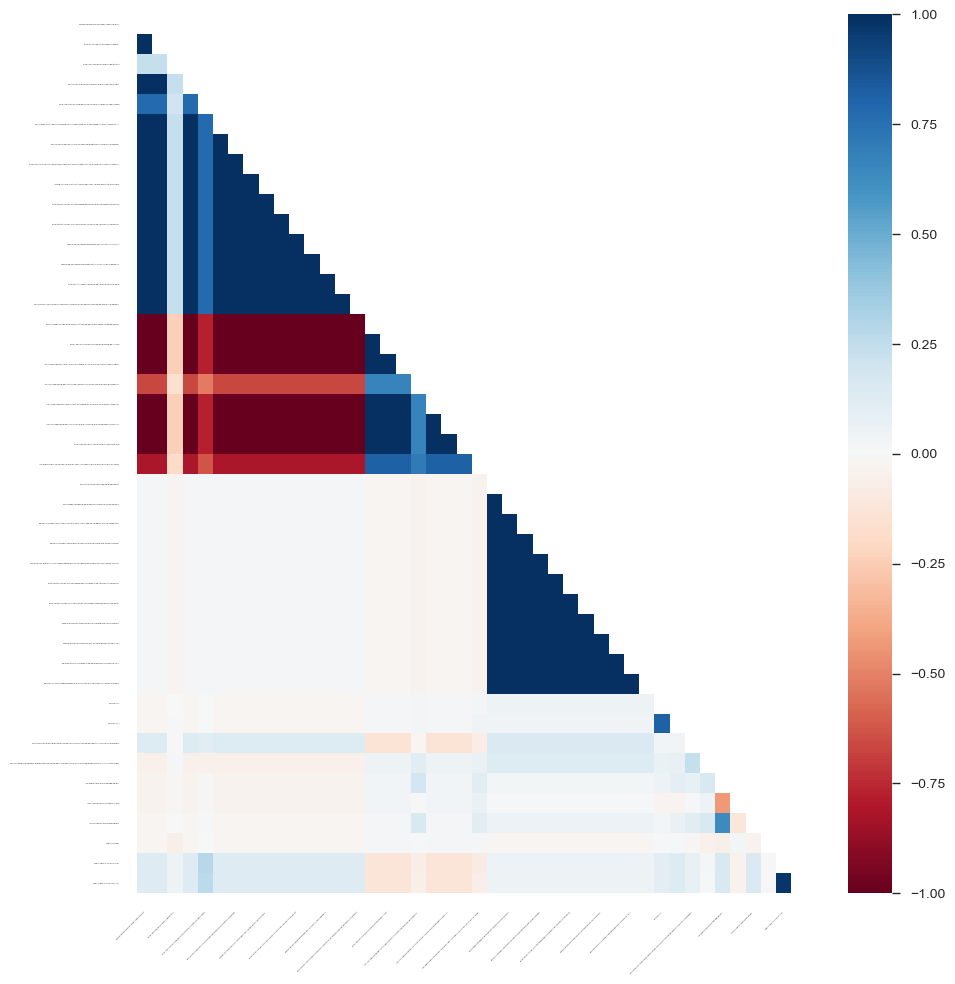

In [455]:
# Data overview 
ProfileReport(df)

In [456]:
# Take closer look at missing values
missing_values = df.isnull().sum()

missing_values

Are you self-employed?                                                                  0
How many employees does your company or organization have?                            287
Is your employer primarily a tech company/organization?                               287
Is your primary role within your company related to tech/IT?                         1170
Does your employer provide mental health benefits as part of healthcare coverage?     287
                                                                                     ... 
What US state or territory do you live in?                                            593
What country do you work in?                                                            0
What US state or territory do you work in?                                            582
Which of the following best describes your work position?                               0
Do you work remotely?                                                                   0
Length: 63

# **2. Clean Data**

In [458]:
# Create copy of dataset
dfc = df.copy(deep = True)

**2.1 Removing columns with too much missing data**

In [460]:
# Columns with Na appearing as 50% or more of the data
col_na = (dfc.isna().sum() >= (1433*0.5))

col_na = col_na[col_na==True]
dfc_na = dfc[col_na.index]

for col in dfc_na:
    print(col)

Is your primary role within your company related to tech/IT?
Do you have medical coverage (private insurance or state-provided) which includes treatment of  mental health issues?
Do you know local or online resources to seek help for a mental health disorder?
If you have been diagnosed or treated for a mental health disorder, do you ever reveal this to clients or business contacts?
If you have revealed a mental health issue to a client or business contact, do you believe this has impacted you negatively?
If you have been diagnosed or treated for a mental health disorder, do you ever reveal this to coworkers or employees?
If you have revealed a mental health issue to a coworker or employee, do you believe this has impacted you negatively?
Do you believe your productivity is ever affected by a mental health issue?
If yes, what percentage of your work time (time performing primary or secondary job functions) is affected by a mental health issue?
Have your observations of how another indiv

After analyzing the columns, it is clear that these missing values will not provide valuable insight into the analysis, therefore they may be removed.


In [462]:
# Removing columns with too many missing data points to effectivly impute
dfc.drop(['Is your primary role within your company related to tech/IT?', 
           'Do you know local or online resources to seek help for a mental health disorder?',
           'If you have been diagnosed or treated for a mental health disorder, do you ever reveal this to clients or business contacts?',
           'If you have revealed a mental health issue to a client or business contact, do you believe this has impacted you negatively?', 
           'If you have been diagnosed or treated for a mental health disorder, do you ever reveal this to coworkers or employees?',
           'If you have revealed a mental health issue to a coworker or employee, do you believe this has impacted you negatively?',
           'Do you believe your productivity is ever affected by a mental health issue?',
           'If yes, what percentage of your work time (time performing primary or secondary job functions) is affected by a mental health issue?',
           'If yes, what condition(s) have you been diagnosed with?',
           'If maybe, what condition(s) do you believe you have?',
           'If so, what condition(s) were you diagnosed with?'], inplace=True, axis=1)

# Remove column that results in error when placed in previous function 
dfc.drop(dfc.columns[15], axis=1, inplace = True)

Further analyzing the remaining columns, there are those which are irrelevant, too qualitative to later encode effectively, or do not seem to provide valuable insight into the data.

In [464]:
# remove columns with inputs that are irrelevant/too qualitative
dfc.drop(['Why or why not?',
          'Why or why not?.1',
          'What US state or territory do you live in?', 
          'What US state or territory do you work in?','What country do you live in?',
          'Which of the following best describes your work position?',
          'What country do you work in?'], inplace=True, axis=1)

**2.2 Dealing with incosistencies and non-standardized data**

Before winsoziration = Min: 3, Max: 323
After winsoziration = Min: 21, Max: 59


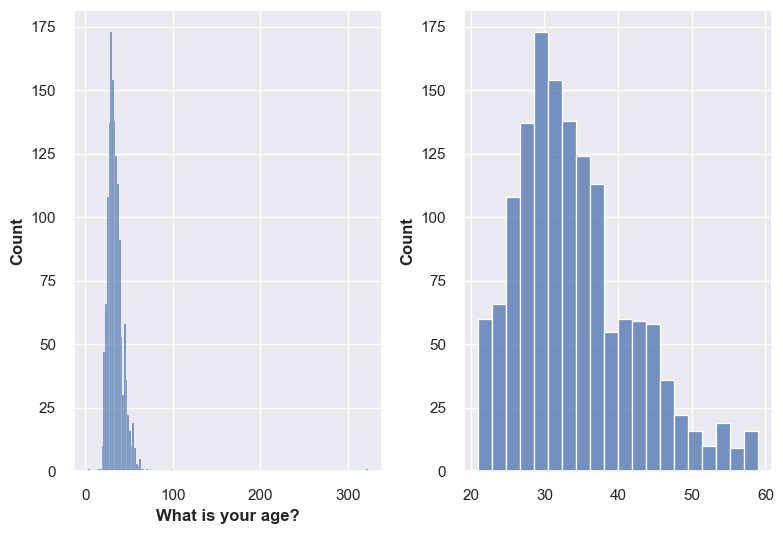

In [466]:
# Looking at the data, we can see that the minimum and maximum ages are suspcious
# Plots the distribution of the ages
# Winsorize the age data, cutting off values below 1% and above 99%
fig, axs = plt.subplots(1, 2)
fig1 = sns.histplot(dfc['What is your age?'],ax = axs[0])
dfc_winsorized = winsorize(dfc['What is your age?'], limits=[0.01, 0.01])
fig2 = sns.histplot(dfc_winsorized, ax = axs[1])

print("Before winsoziration = Min: " + str(dfc['What is your age?'].min()) + ", Max: " 
      + str(dfc['What is your age?'].max()))
print("After winsoziration = Min: " + str(dfc_winsorized.min()) + ", Max: " 
      + str(dfc_winsorized.max()))

Distribution of Ages after Winsorization


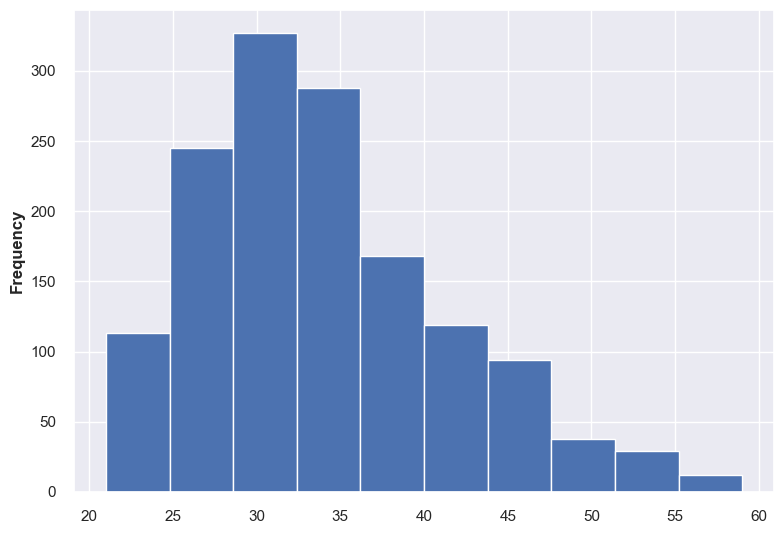

In [467]:
# The graphs are relatively skewed
# Using the median to replace the min and max ages
change_age = dfc[(dfc["What is your age?"] >= dfc_winsorized.min()) | (dfc["What is your age?"] <= dfc_winsorized.max())]["What is your age?"].median()

dfc["What is your age?"].replace(to_replace = dfc[(dfc["What is your age?"] < dfc_winsorized.min()) | 
                                                  (dfc["What is your age?"] > dfc_winsorized.max())]["What is your age?"].tolist(), 
                                 value = change_age, inplace = True)

dfc["What is your age?"].plot(kind = 'hist')
print("Distribution of Ages after Winsorization")

In [468]:
# Check gender values
dfc['What is your gender?'].unique()

array(['Male', 'male', 'Male ', 'Female', 'M', 'female', 'm',
       'I identify as female.', 'female ', 'Bigender', 'non-binary',
       'Female assigned at birth ', 'F', 'Woman', 'man', 'fm', 'f',
       'Cis female ', 'Transitioned, M2F', 'Genderfluid (born female)',
       'Other/Transfeminine', 'Female or Multi-Gender Femme', 'Female ',
       'woman', 'female/woman', 'Cis male', 'Male.', 'Androgynous',
       'male 9:1 female, roughly', nan, 'Male (cis)', 'Other',
       'nb masculine', 'Cisgender Female', 'Man', 'Sex is male',
       'none of your business', 'genderqueer', 'cis male', 'Human',
       'Genderfluid', 'Enby', 'Malr', 'genderqueer woman', 'mtf', 'Queer',
       'Agender', 'Dude', 'Fluid',
       "I'm a man why didn't you make this a drop down question. You should of asked sex? And I would of answered yes please. Seriously how much text can this take? ",
       'mail', 'M|', 'Male/genderqueer', 'fem', 'Nonbinary', 'male ',
       'human', 'Female (props for making th

In [469]:
# Standardize the gender values
male = ["male", "Male", "M", "m", "man", "Cis male", "Male.", "male 9:1 female, roughly", "Male (cis)", "Man", "Sex is male",
        "cis male", "Malr", "Dude", "mail", "M|", "Male/genderqueer", "male ", "Cis Male", "cisdude", "cis man", "MALE", "Male ",
        "Male (trans, FtM)", "I'm a man why didn't you make this a drop down question. You should of asked sex? And I would of answered yes please. Seriously how much text can this take? "]

dfc['What is your gender?'].replace(to_replace=male, value='Male', inplace=True)


female = ['Female', 'female', 'female ',  'F', 'Woman', 'fm', 'f', 'Cis female ', 'Transitioned, M2F', ' Female', 'Cis-woman',
          'AFAB','Genderfluid (born female)', 'Female ', 'woman', 'female/woman', 'Cisgender Female', 'fem',
          'female-bodied; no feelings about gender', 'Female (props for making this a freeform field, though)', 
          'I identify as female.', 'Female assigned at birth ', 'Female or Multi-Gender Femme', 'mtf', 'Transgender woman']

dfc['What is your gender?'].replace(to_replace=female, value='Female', inplace=True)


other = ['non-binary', 'Agender', 'Nonbinary', 'Queer', 'nb masculine', 'human', 'genderqueer woman', 'genderqueer', 'Unicorn', 
         'Bigender', 'Enby', 'Other', 'Other/Transfeminine', 'Human', 'Genderqueer', 'Genderflux demi-girl', 'Genderfluid', 
         'Fluid', 'Enby Bigender', 'Androgynous', 'none of your business']

dfc['What is your gender?'].replace(to_replace=other, value='Other', inplace=True)

dfc[['What is your gender?']].value_counts()

What is your gender?
Male                    1060
Female                   345
Other                     25
Name: count, dtype: int64

In [470]:
dfc.columns

Index(['Are you self-employed?',
       'How many employees does your company or organization have?',
       'Is your employer primarily a tech company/organization?',
       'Does your employer provide mental health benefits as part of healthcare coverage?',
       'Do you know the options for mental health care available under your employer-provided coverage?',
       'Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?',
       'Does your employer offer resources to learn more about mental health concerns and options for seeking help?',
       'Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?',
       'If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:',
       'Do you think that discussing a mental health disorder with your employer would have negative

**2.3 Separating columns by data type**

In [472]:
# making lists of the types of data in the columns

ordered_categorical = ['How many employees does your company or organization have?', 'Does your employer provide mental health benefits as part of healthcare coverage?',
           'Do you know the options for mental health care available under your employer-provided coverage?', 'Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?',
           'Does your employer offer resources to learn more about mental health concerns and options for seeking help?', 'Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?',
           'If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:', 'Do you think that discussing a mental health disorder with your employer would have negative consequences?',
           'Do you think that discussing a physical health issue with your employer would have negative consequences?', 'Would you feel comfortable discussing a mental health disorder with your coworkers?', 'Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?',
           'Do you feel that your employer takes mental health as seriously as physical health?', 'Have your previous employers provided mental health benefits?', 'Were you aware of the options for mental health care provided by your previous employers?',
           'Did your previous employers ever formally discuss mental health (as part of a wellness campaign or other official communication)?', 'Did your previous employers provide resources to learn more about mental health issues and how to seek help?',
           'Was your anonymity protected if you chose to take advantage of mental health or substance abuse treatment resources with previous employers?', 'Do you think that discussing a mental health disorder with previous employers would have negative consequences?',
           'Do you think that discussing a physical health issue with previous employers would have negative consequences?', 'Would you have been willing to discuss a mental health issue with your previous co-workers?', 'Would you have been willing to discuss a mental health issue with your direct supervisor(s)?',
           'Did you feel that your previous employers took mental health as seriously as physical health?', 'Did you hear of or observe negative consequences for co-workers with mental health issues in your previous workplaces?', 'Would you be willing to bring up a physical health issue with a potential employer in an interview?',
           'Would you bring up a mental health issue with a potential employer in an interview?', 'Do you feel that being identified as a person with a mental health issue would hurt your career?', 'Do you think that team members/co-workers would view you more negatively if they knew you suffered from a mental health issue?',
           'How willing would you be to share with friends and family that you have a mental illness?', 'Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?', 'Have your observations of how another individual who discussed a mental health disorder made you less likely to reveal a mental health issue yourself in your current workplace?',
           'Do you have a family history of mental illness?', 'Have you had a mental health disorder in the past?', 'Do you currently have a mental health disorder?', 'If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?',
           'If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?', 'Do you work remotely?']

boolean = ['Are you self-employed?', 'Is your employer primarily a tech company/organization?', 'Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?', 'Do you have previous employers?',
           'Have you been diagnosed with a mental health condition by a medical professional?', 'Have you ever sought treatment for a mental health issue from a mental health professional?']

text = ['What is your gender?']

numerical = ['What is your age?']

**2.4 Manually encoding data**

Manually encoding the data instead of using sklearn label encoder because the different responses have order which is valuable to how the features' importance are weighed, so the different features can't be randomly assigned values in this case. 

In [475]:
# Make copy of DataFrame before encoding for visualisations

visuals_df = dfc.copy(deep=True)

**2.4.1 Boolean Features**

In [477]:
# making boolean values 0's and 1's
for feature in boolean: 
    dfc[feature] = dfc[feature].apply(lambda x: 1 if x == 'Yes' or x == 1 or x == 'True' else 0)

**2.4.2 Ordered categorical Features**

In [479]:
encoding_responses = {'How many employees does your company or organization have?': {"1-5": 0, "6-25": 1, "26-100": 2, "100-500": 3, "500-1000": 4, "More than 1000": 5},
                      'Does your employer provide mental health benefits as part of healthcare coverage?': {"Yes":2, "I don't know":1, "No":0, "Not eligible for coverage / N/A":0},
                      'Do you know the options for mental health care available under your employer-provided coverage?': {"No":0, "I am not sure":1, "Yes":2},
                      'Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?': {"Yes":2, "I don't know":1, "No":0},
                      'Does your employer offer resources to learn more about mental health concerns and options for seeking help?': {"Yes":2, "I don't know":1, "No":0},
                      'Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?': {"Yes":2, "I don't know":1, "No":0},
                      'If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:': {"I don't know":0, "Very difficult":1, "Somewhat difficult":2, "Neither easy nor difficult":0, "Somewhat easy":3, "Very easy":4},
                      'Do you think that discussing a mental health disorder with your employer would have negative consequences?': {"Yes":2, "Maybe":1, "No":0},
                      'Do you think that discussing a physical health issue with your employer would have negative consequences?': {"Yes":2, "Maybe":1, "No":0},
                      'Would you feel comfortable discussing a mental health disorder with your coworkers?': {"Yes":2, "Maybe":1, "No":0},
                      'Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?': {"Yes":2, "Maybe":1, "No":0},
                      'Do you feel that your employer takes mental health as seriously as physical health?': {"Yes":2, "I don't know":1, "No":0},
                      'Have your previous employers provided mental health benefits?': {"No, none did":0, "I don't know":1, "Some did":2, "Yes, they all did":3},
                      'Were you aware of the options for mental health care provided by your previous employers?': {"N/A (not currently aware)":0, "No, I only became aware later":0, "I was aware of some":1, "Yes, I was aware of all of them":2},
                      'Did your previous employers ever formally discuss mental health (as part of a wellness campaign or other official communication)?': {"None did":0, "I don't know":1, "Some did":2, "Yes, they all did":3},
                      'Did your previous employers provide resources to learn more about mental health issues and how to seek help?': {'None did': 0, 'Some did': 1, 'Yes, they all did': 2},
                      'Was your anonymity protected if you chose to take advantage of mental health or substance abuse treatment resources with previous employers?': {"No":0, "I don't know":1, "Sometimes":2, "Yes, always":3},
                      'Do you think that discussing a mental health disorder with previous employers would have negative consequences?': {"None of them":0, "I don't know":1, "Some of them":2, "Yes, all of them":3},
                      'Do you think that discussing a physical health issue with previous employers would have negative consequences?': {"None of them":0, "Some of them":1, "Yes, all of them":2},
                      'Would you have been willing to discuss a mental health issue with your previous co-workers?': {"No, at none of my previous employers":0, "Some of my previous employers":1, "Yes, at all of my previous employers":2},
                      'Would you have been willing to discuss a mental health issue with your direct supervisor(s)?': {"No, at none of my previous employers":0, "I don't know":1, "Some of my previous employers":2, "Yes, at all of my previous employers":3},
                      'Did you feel that your previous employers took mental health as seriously as physical health?': {"None did":0, "I don't know":1, "Some did":2, "Yes, they all did":3},
                      'Did you hear of or observe negative consequences for co-workers with mental health issues in your previous workplaces?': {"None of them":0, "Some of them":1, "Yes, all of them":2},
                      'Would you be willing to bring up a physical health issue with a potential employer in an interview?': {"Yes":2, "Maybe":1, "No":0},
                      'Would you bring up a mental health issue with a potential employer in an interview?': {"Yes":2, "Maybe":1, "No":0},
                      'Do you feel that being identified as a person with a mental health issue would hurt your career?': {"No, I don't think it would":0, "No, it has not":0, "Maybe":1, "Yes, I think it would":2, "Yes, it has":2},
                      'Do you think that team members/co-workers would view you more negatively if they knew you suffered from a mental health issue?': {"No, I don't think they would":0, "No, they do not":0, "Maybe":1, "Yes, I think they would":2, "Yes, they do":2},
                      'How willing would you be to share with friends and family that you have a mental illness?': {"Not applicable to me (I do not have a mental illness)":0, "Not open at all":0, "Somewhat not open":1, "Neutral":2, "Somewhat open":3, "Very open":4},
                      'Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?': {"No":0, "Maybe/Not sure":1, "Yes, I observed":2, "Yes, I experienced":2},
                      'Have your observations of how another individual who discussed a mental health disorder made you less likely to reveal a mental health issue yourself in your current workplace?': {"Yes":2, "Maybe":1, "No":0},
                      'Do you have a family history of mental illness?': {"Yes":2, "I don't know":1, "No":0},
                      'Have you had a mental health disorder in the past?': {"Yes":2, "Maybe":1, "No":0},
                      'Do you currently have a mental health disorder?': {"Yes":2, "Maybe":1, "No":0},
                      'If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?': {"Not applicable to me":0, "Never":0, "Rarely":1, "Sometimes":2, "Often":3},
                      'If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?': {"Not applicable to me":0, "Never":0, "Rarely":1, "Sometimes":2, "Often":3},
                      'Do you work remotely?': {"Never":0, "Sometimes":1, "Always":2}
                     }

In [480]:
for feature in ordered_categorical:
    dfc[feature] = dfc[feature].apply(lambda x: encoding_responses[feature][x] if x in encoding_responses[feature] else x)

In [481]:
# check datatypes
dfc.dtypes

Are you self-employed?                                                                                                                                                                int64
How many employees does your company or organization have?                                                                                                                          float64
Is your employer primarily a tech company/organization?                                                                                                                               int64
Does your employer provide mental health benefits as part of healthcare coverage?                                                                                                   float64
Do you know the options for mental health care available under your employer-provided coverage?                                                                                     float64
Has your employer ever formally discussed mental health (for

**2.5 Imputing Missing Values**

Note: No numerical columns have missing values

In [484]:
# One-hot encoding genders
dfc = pd.get_dummies(dfc, columns=["What is your gender?"])

Imputing missing values for the boolean features

In [486]:
# Imputing using RandomForestClassifier because it is a classification problem
for feature in dfc.columns: 
    if feature in ordered_categorical:
        continue
    
    impute_dfc = dfc.copy()
    impute_dfc.dropna(inplace=True)
    
    # split data into train and test
    X = impute_dfc.drop(feature, axis=1)
    y = impute_dfc[feature]
    
    model = RandomForestClassifier(n_estimators=10)
    model.fit(X, y)
    
    # Impute missing values in dfc with the predictions of the model
    dfc[feature] = dfc[feature].apply(lambda x: model.predict(dfc.drop(feature, axis=1).dropna())[0] if pd.isna(x) else x)
    
    print(f"Finished imputing {feature}")

Finished imputing Are you self-employed?
Finished imputing Is your employer primarily a tech company/organization?
Finished imputing Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?
Finished imputing Do you have previous employers?
Finished imputing Have you been diagnosed with a mental health condition by a medical professional?
Finished imputing Have you ever sought treatment for a mental health issue from a mental health professional?
Finished imputing What is your age?
Finished imputing What is your gender?_Female
Finished imputing What is your gender?_Male
Finished imputing What is your gender?_Other


Imputing missing values for the categorical features

In [488]:
# Imputing using RandomForestRegressor
for feature in dfc.columns: 
    if feature in boolean:
        continue
        
    impute_dfc = dfc.copy()
    impute_dfc.dropna(inplace=True)
    
    # split data into train and test
    X = impute_dfc.drop(feature, axis=1)
    y = impute_dfc[feature]
    
    model = RandomForestRegressor(n_estimators=10)
    model.fit(X, y)
    
    # Impute missing values in dfc with the predictions of the model
    dfc[feature] = dfc[feature].apply(lambda x: model.predict(dfc.drop(feature, axis=1).dropna())[0] if pd.isna(x) else x)
    
    print(f"Finished Imputing {feature}")

Finished Imputing How many employees does your company or organization have?
Finished Imputing Does your employer provide mental health benefits as part of healthcare coverage?
Finished Imputing Do you know the options for mental health care available under your employer-provided coverage?
Finished Imputing Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?
Finished Imputing Does your employer offer resources to learn more about mental health concerns and options for seeking help?
Finished Imputing Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?
Finished Imputing If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:
Finished Imputing Do you think that discussing a mental health disorder with your employer would have negative consequences?
Finished Imputing 

Check if there are any missing values left

In [490]:
# check missing values 
missing_values = dfc.isnull().sum()

missing_values

Are you self-employed?                                                                                                                                                              0
How many employees does your company or organization have?                                                                                                                          0
Is your employer primarily a tech company/organization?                                                                                                                             0
Does your employer provide mental health benefits as part of healthcare coverage?                                                                                                   0
Do you know the options for mental health care available under your employer-provided coverage?                                                                                     0
Has your employer ever formally discussed mental health (for example, as part of a wellnes

# **3. Transforming the Data**

In [492]:
# save column names
column_names = dfc.columns

# Copy of df before scaling
ns_df = dfc.copy(deep=True)

# Standard Scaling 
scaler = StandardScaler()
scaled_dfc = scaler.fit_transform(dfc)

# New DataFrame with the scaled data and original columns 
scaled_dfc = pd.DataFrame(scaled_dfc, columns=column_names)

In [493]:
scaled_dfc.describe()

,Are you self-employed?,How many employees does your company or organization have?,Is your employer primarily a tech company/organization?,Does your employer provide mental health benefits as part of healthcare coverage?,Do you know the options for mental health care available under your employer-provided coverage?,"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",Does your employer offer resources to learn more about mental health concerns and options for seeking help?,Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?,"If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:",Do you think that discussing a mental health disorder with your employer would have negative consequences?,...,Do you currently have a mental health disorder?,Have you been diagnosed with a mental health condition by a medical professional?,Have you ever sought treatment for a mental health issue from a mental health professional?,"If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?","If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?",What is your age?,Do you work remotely?,What is your gender?_Female,What is your gender?_Male,What is your gender?_Other
count,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,...,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03,1.433000e+03
mean,1.487528e-17,9.916856e-17,-1.090854e-16,-2.479214e-17,2.479214e-18,-9.916856e-17,-9.916856e-18,-8.925170e-17,7.933485e-17,-2.727135e-16,...,-1.710658e-16,-2.727135e-17,9.668935e-17,8.429328e-17,1.487528e-17,4.760091e-16,-6.941799e-17,-6.693878e-17,-3.594860e-17,3.718821e-18
std,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,...,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00,1.000349e+00
min,-5.004361e-01,-1.522401e+00,-1.267065e+00,-1.633237e+00,-1.278380e+00,-5.252309e-01,-7.916336e-01,-2.307318e+00,-1.056894e+00,-1.259887e+00,...,-1.173938e+00,-9.993024e-01,-1.188469e+00,-9.252450e-01,-1.302589e+00,-1.722593e+00,-1.466197e+00,-5.631124e-01,-1.685771e+00,-1.332504e-01
25%,-5.004361e-01,-8.800545e-01,-1.267065e+00,-2.767813e-01,-2.606475e-01,-5.252309e-01,-7.916336e-01,-3.262595e-01,-9.249897e-01,-1.259887e+00,...,-1.173938e+00,-9.993024e-01,-1.188469e+00,-9.252450e-01,-1.302589e+00,-6.570446e-01,-1.016075e-02,-5.631124e-01,-1.685771e+00,-1.332504e-01
50%,-5.004361e-01,-2.377084e-01,7.892253e-01,-5.490189e-03,-2.606475e-01,-5.252309e-01,-7.916336e-01,-3.262595e-01,-3.973709e-01,1.086604e-01,...,-3.497176e-02,-9.993024e-01,8.414189e-01,1.312300e-01,2.581218e-01,-1.242706e-01,-1.016075e-02,-5.631124e-01,5.932005e-01,-1.332504e-01
75%,-5.004361e-01,4.046377e-01,7.892253e-01,1.079674e+00,1.755236e-01,-5.252309e-01,4.549719e-01,-3.262595e-01,9.216760e-01,2.607212e-01,...,1.103995e+00,1.000698e+00,8.414189e-01,1.187705e+00,1.038477e+00,5.416970e-01,-1.016075e-02,-5.631124e-01,5.932005e-01,-1.332504e-01
max,1.998257e+00,1.689330e+00,7.892253e-01,1.079674e+00,1.629427e+00,2.148502e+00,1.701577e+00,1.654799e+00,1.581199e+00,1.781330e+00,...,1.103995e+00,1.000698e+00,8.414189e-01,2.244180e+00,1.038477e+00,3.338761e+00,1.445875e+00,1.775844e+00,5.932005e-01,7.504665e+00


Physical Health has an impact on mental health. However, due to the lack of numerical data in the dataset relating to the rates of low physical health, it is difficult to accurately and effectively find correlations between our mental-health-related features. 

With this in mind, I am removing the features relating to physical health.

In [495]:
scaled_dfc.drop(['Do you think that discussing a physical health issue with your employer would have negative consequences?',
                 'Do you feel that your employer takes mental health as seriously as physical health?',
                 'Do you think that discussing a physical health issue with previous employers would have negative consequences?',
                 'Did you feel that your previous employers took mental health as seriously as physical health?',
                 'Would you be willing to bring up a physical health issue with a potential employer in an interview?',
                 ], inplace=True, axis=1)

In [496]:
scaled_dfc.shape

(1433, 41)

# **4. Dimensionality Reduction**

Principal Component Analysis is a feature engineering method that also acts as a method for dimensionality reduction. 

In [499]:
# PCA for dimensionality Reduction, 
pca = PCA(0.8)
x_pca = pca.fit_transform(scaled_dfc)
x_pca.shape

(1433, 21)

In [500]:
# Convert principal components to dataframe

comp_names = [f"PC{i+1}" for i in range(x_pca.shape[1])]
cp_pca = pd.DataFrame(x_pca, columns=comp_names)

# Get original feature names
loadings = pd.DataFrame(pca.components_.T,
                        columns=comp_names,
                        index=scaled_dfc.columns
                       )

loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21
Are you self-employed?,-0.059723,-0.157351,-0.327946,0.286295,0.169815,-0.106721,-0.120914,0.229536,-0.053953,0.080662,...,0.001686,-0.013105,-0.069331,0.000637,0.082294,-0.054401,0.012432,0.021619,0.047757,-0.023566
How many employees does your company or organization have?,-0.001924,0.122783,0.322912,-0.158988,-0.091271,-0.138217,-0.070489,0.127807,0.276101,-0.034100,...,0.027304,-0.133169,0.120252,-0.114806,-0.236462,-0.039797,0.166157,0.015900,-0.041446,0.287847
Is your employer primarily a tech company/organization?,0.052927,0.132422,0.180283,-0.198715,-0.134369,0.145912,0.194225,-0.389634,-0.105332,-0.098109,...,-0.265560,0.131487,0.134704,-0.109437,0.015072,0.061897,0.009384,0.067390,-0.040694,-0.103618
Does your employer provide mental health benefits as part of healthcare coverage?,-0.058291,0.192745,0.135692,0.090818,0.125567,-0.203154,-0.254510,0.178068,0.080023,0.033735,...,-0.325268,0.123219,0.067435,0.025568,-0.159302,-0.042448,-0.004595,0.170408,-0.025195,0.285365
Do you know the options for mental health care available under your employer-provided coverage?,-0.085759,0.212074,0.088308,-0.026096,0.049580,-0.077800,-0.151053,0.124897,0.054611,0.033444,...,-0.244135,0.162873,0.071856,0.344699,-0.017333,0.137175,-0.316098,-0.001415,-0.002900,-0.420737
"Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?",0.039549,0.186612,0.193199,-0.170269,0.118010,-0.125747,0.010911,0.222446,0.058168,0.066041,...,0.087499,-0.201007,-0.215814,-0.012367,0.321016,-0.117667,-0.040177,-0.045671,0.228312,-0.474501
Does your employer offer resources to learn more about mental health concerns and options for seeking help?,0.019647,0.227036,0.302362,-0.125928,0.063340,-0.136442,-0.081137,0.178661,0.132248,-0.014886,...,-0.001438,-0.211112,-0.071259,-0.144916,0.057647,-0.001579,-0.002897,0.029926,0.024514,0.001011
Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?,0.034765,0.216995,0.125354,-0.041165,0.102432,-0.090295,-0.089325,0.184379,-0.058293,0.226496,...,0.143082,0.420633,-0.119695,-0.321323,0.207230,0.143629,0.175122,-0.198018,-0.179734,0.140558
"If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:",0.112679,0.210592,0.107244,-0.220973,0.025841,0.105824,0.161669,-0.120212,-0.156099,-0.178946,...,-0.066229,0.135298,0.033604,-0.038432,-0.169988,0.071887,-0.124229,-0.240004,0.060223,-0.043785
Do you think that discussing a mental health disorder with your employer would have negative consequences?,-0.177737,-0.234337,0.150712,0.068074,-0.173071,0.000610,0.007703,0.026107,0.226680,0.009521,...,-0.087261,-0.067530,0.103272,0.032366,0.177243,0.146083,0.096175,-0.033944,0.012278,0.047037


# **5. Clustering**

K-means clustering is effective with high-dimensionality data

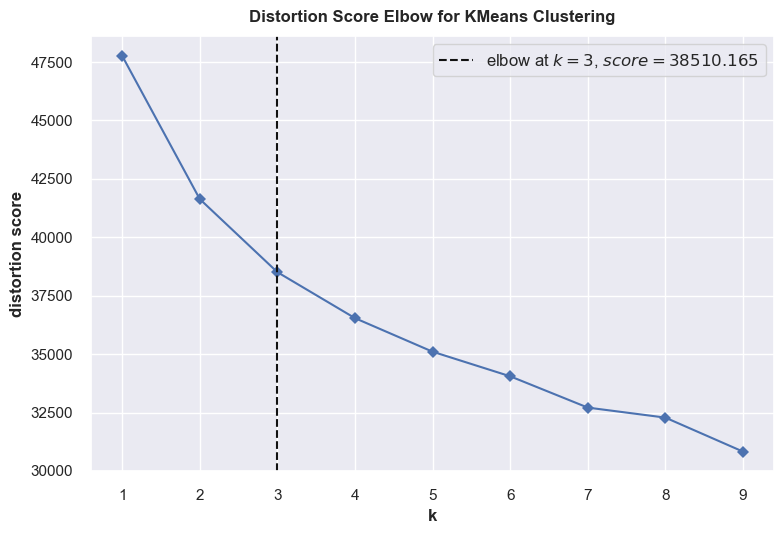

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [503]:
# Using Elbow method to find optimal K for K-means cluster
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,10), \
                              timings=False) 

X = x_pca

visualizer.fit(X)
visualizer.show()

In [504]:
# According to the elbow method, we should set clustering to 3 clusters
kmeans_3 = KMeans(n_clusters=3)
label = kmeans_3.fit_predict(x_pca)
#features = x_pca.columns()

KM_dfc = pd.DataFrame({'label': label, 'features': label})

# create crosstab (ct) to provide better information about the relationship between the variables
ct = pd.crosstab(KM_dfc['label'], KM_dfc['features'])

print(ct)

print(label)

features    0    1    2
label                  
0         544    0    0
1           0  321    0
2           0    0  568
[2 1 2 ... 1 0 0]


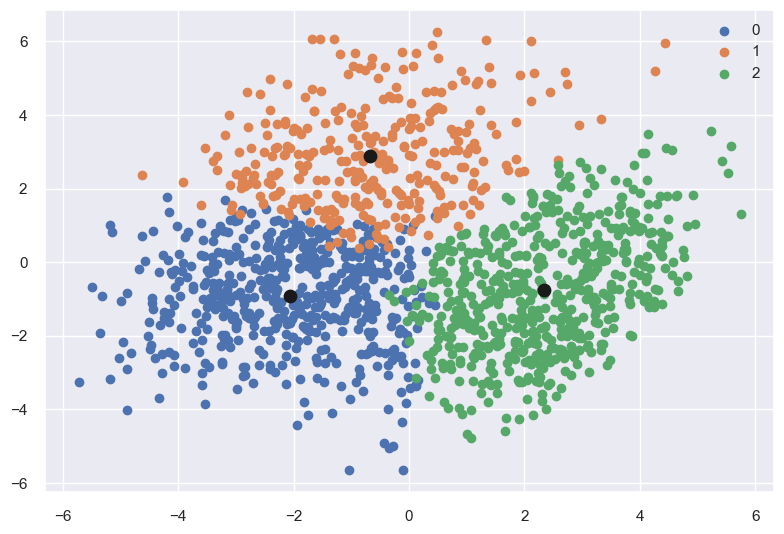

In [505]:
# unique labels and centroids

u_labels = np.unique(label)
centroids = kmeans_3.cluster_centers_

# Plotting results

for i in u_labels:
    plt.scatter(x_pca[label == i , 0] , x_pca[label == i , 1] , label = i)
plt.scatter(centroids[:,0], centroids[:,1], s=80, color='k')
plt.legend()
plt.show()

In [506]:
# renaming columns to easier visualise data
scaled_dfc.columns = [
    "self_employed", # Are you self-employed?
    "employee_count", # How many employees does your company or organization have?
    "tech_company", # Is your employer primarily a tech company/organization?
    "mh_benefits", # Does your employer provide mental health benefits as part of healthcare coverage?
    "mh_options", # Do you know the options for mental health care available under your employer-provided coverage?
    "formal_dsc_mh", # Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?
    "employer_rsrc_mh", # Does your employer offer resources to learn more about mental health concerns and options for seeking help?
    "anon_protected", # Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?
    "mh_leave_rq", # If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:
    "mh_employer_disc_neg", # Do you think that discussing a mental health disorder with your employer would have negative consequences?
    "mh_disc_cowork", # Would you feel comfortable discussing a mental health disorder with your coworkers?
    "mh_disc_supervisor", # Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?
    "mh_neg_consq", # Have you heard of or observed negative consequences for co-workers who have been open about mental health issues in your workplace?
    "prev_employer", # Do you have previous employers?
    "prev_emp_mh_bnft", # Have your previous employers provided mental health benefits?
    "aware_mh_bnft_prev_emp", # Were you aware of the options for mental health care provided by your previous employers?
    "prev_emp_formal_dsc_mh", # Did your previous employers ever formally discuss mental health (as part of a wellness campaign or other official communication)?
    "prev_emp_rsrc_mh", # Did your previous employers provide resources to learn more about mental health issues and how to seek help?
    "prev_emp_anon_protected", # Was your anonymity protected if you chose to take advantage of mental health or substance abuse treatment resources with previous employers?
    "prev_emp_mh_disc_neg", # Do you think that discussing a mental health disorder with previous employers would have negative consequences?
    "prev_mh_disc_cowork", # Would you have been willing to discuss a mental health issue with your previous co-workers?
    "prev_mh_disc_supervisor", # Would you have been willing to discuss a mental health issue with your direct supervisor(s)?
    "prev_emp_mh_neg_consq", # Did you hear of or observe negative consequences for co-workers with mental health issues in your previous workplaces?
    "mh_in_interview", # Would you bring up a mental health issue with a potential employer in an interview?
    "mh_id_hurt_career", # Do you feel that being identified as a person with a mental health issue would hurt your career?
    "mh_id_cowork_neg_view", # Do you think that team members/co-workers would view you more negatively if they knew you suffered from a mental health issue?
    "mh_share_family_friends", # How willing would you be to share with friends and family that you have a mental illness?
    "mh_exp_neg_workplace", # Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace? 
    "mh_obs_less_likely", # Have your observations of how another individual who discussed a mental health disorder made you less likely to reveal a mental health issue yourself in your current workplace?
    "mh_family_history", # Do you have a family history of mental illness?
    "past_mh", # Have you had a mental health disorder in the past?
    "current_mh", # Do you currently have a mental health disorder?
    "diagnosed_mh", # Have you been diagnosed with a mental health condition by a medical professional?
    "seek_prof_mh_treatment", # Have you ever sought treatment for a mental health issue from a mental health professional?
    "mh_interfere_treated", # If you have a mental health issue, do you feel that it interferes with your work when being treated effectively?
    "mh_interfere_not_treated", # If you have a mental health issue, do you feel that it interferes with your work when NOT being treated effectively?
    "age", # What is your age?
    "remote", # Do you work remotely?
    "gender_female", # What is your gender?_Female
    "gender_male", # What is your gender?_Male
    "gender_other", # What is your gender?_Other
]
    
    

In [507]:
scaled_dfc.columns

Index(['self_employed', 'employee_count', 'tech_company', 'mh_benefits',
       'mh_options', 'formal_dsc_mh', 'employer_rsrc_mh', 'anon_protected',
       'mh_leave_rq', 'mh_employer_disc_neg', 'mh_disc_cowork',
       'mh_disc_supervisor', 'mh_neg_consq', 'prev_employer',
       'prev_emp_mh_bnft', 'aware_mh_bnft_prev_emp', 'prev_emp_formal_dsc_mh',
       'prev_emp_rsrc_mh', 'prev_emp_anon_protected', 'prev_emp_mh_disc_neg',
       'prev_mh_disc_cowork', 'prev_mh_disc_supervisor',
       'prev_emp_mh_neg_consq', 'mh_in_interview', 'mh_id_hurt_career',
       'mh_id_cowork_neg_view', 'mh_share_family_friends',
       'mh_exp_neg_workplace', 'mh_obs_less_likely', 'mh_family_history',
       'past_mh', 'current_mh', 'diagnosed_mh', 'seek_prof_mh_treatment',
       'mh_interfere_treated', 'mh_interfere_not_treated', 'age', 'remote',
       'gender_female', 'gender_male', 'gender_other'],
      dtype='object')

In [508]:
######################## Feature names before PCA
feature_names = scaled_dfc.columns

######################## Number of features before PCA
n_features = pca.n_features_in_

######################## PC names 
pc_list = [f'PC{i}' for i in list(range(1, n_features + 1))]

######################## Match PC names to loadings 
loadings = pca.components_

pc_loadings = dict(zip(pc_list, loadings))

######################## Matrix of corr coefs betwen feature names and PCs
loadings_df = pd.DataFrame.from_dict(pc_loadings)
loadings_df['feature_names'] = feature_names
loadings_df = loadings_df.set_index('feature_names')
loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21
feature_names,,,,,,,,,,,,,,,,,,,,,
self_employed,-0.059723,-0.157351,-0.327946,0.286295,0.169815,-0.106721,-0.120914,0.229536,-0.053953,0.080662,...,0.001686,-0.013105,-0.069331,0.000637,0.082294,-0.054401,0.012432,0.021619,0.047757,-0.023566
employee_count,-0.001924,0.122783,0.322912,-0.158988,-0.091271,-0.138217,-0.070489,0.127807,0.276101,-0.034100,...,0.027304,-0.133169,0.120252,-0.114806,-0.236462,-0.039797,0.166157,0.015900,-0.041446,0.287847
tech_company,0.052927,0.132422,0.180283,-0.198715,-0.134369,0.145912,0.194225,-0.389634,-0.105332,-0.098109,...,-0.265560,0.131487,0.134704,-0.109437,0.015072,0.061897,0.009384,0.067390,-0.040694,-0.103618
mh_benefits,-0.058291,0.192745,0.135692,0.090818,0.125567,-0.203154,-0.254510,0.178068,0.080023,0.033735,...,-0.325268,0.123219,0.067435,0.025568,-0.159302,-0.042448,-0.004595,0.170408,-0.025195,0.285365
mh_options,-0.085759,0.212074,0.088308,-0.026096,0.049580,-0.077800,-0.151053,0.124897,0.054611,0.033444,...,-0.244135,0.162873,0.071856,0.344699,-0.017333,0.137175,-0.316098,-0.001415,-0.002900,-0.420737
formal_dsc_mh,0.039549,0.186612,0.193199,-0.170269,0.118010,-0.125747,0.010911,0.222446,0.058168,0.066041,...,0.087499,-0.201007,-0.215814,-0.012367,0.321016,-0.117667,-0.040177,-0.045671,0.228312,-0.474501
employer_rsrc_mh,0.019647,0.227036,0.302362,-0.125928,0.063340,-0.136442,-0.081137,0.178661,0.132248,-0.014886,...,-0.001438,-0.211112,-0.071259,-0.144916,0.057647,-0.001579,-0.002897,0.029926,0.024514,0.001011
anon_protected,0.034765,0.216995,0.125354,-0.041165,0.102432,-0.090295,-0.089325,0.184379,-0.058293,0.226496,...,0.143082,0.420633,-0.119695,-0.321323,0.207230,0.143629,0.175122,-0.198018,-0.179734,0.140558
mh_leave_rq,0.112679,0.210592,0.107244,-0.220973,0.025841,0.105824,0.161669,-0.120212,-0.156099,-0.178946,...,-0.066229,0.135298,0.033604,-0.038432,-0.169988,0.071887,-0.124229,-0.240004,0.060223,-0.043785


In [509]:
# add cluster column for visualisations
cluster_dfc = scaled_dfc.copy(deep=True)

cluster_dfc['cluster'] = kmeans_3.fit_predict(x_pca)

In [510]:
dfc_cluster_0 = cluster_dfc[cluster_dfc['cluster'] == 0]
dfc_cluster_1 = cluster_dfc[cluster_dfc['cluster'] == 1]
dfc_cluster_2 = cluster_dfc[cluster_dfc['cluster'] == 2]

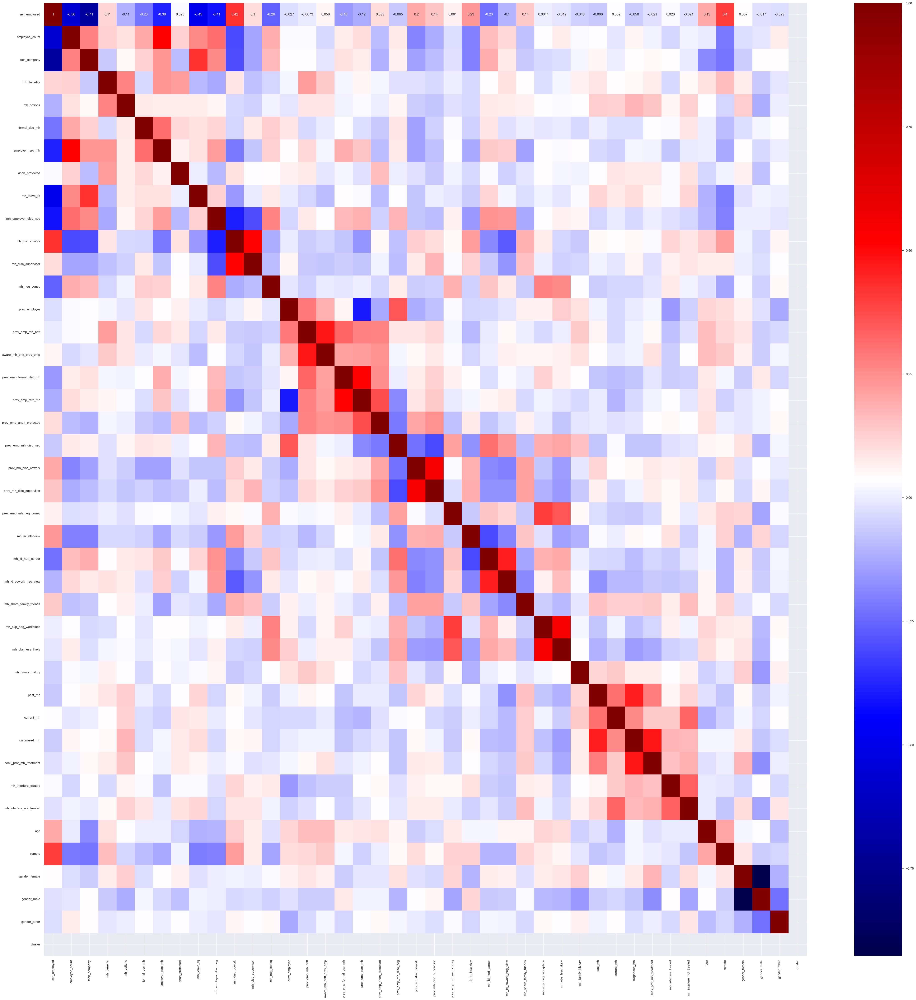

In [511]:
corr_mat = dfc_cluster_0.corr()

# generate heatmap 

plt.figure(figsize=(48,48))
sns.heatmap(corr_mat, annot=True, cmap='seismic')
plt.show()

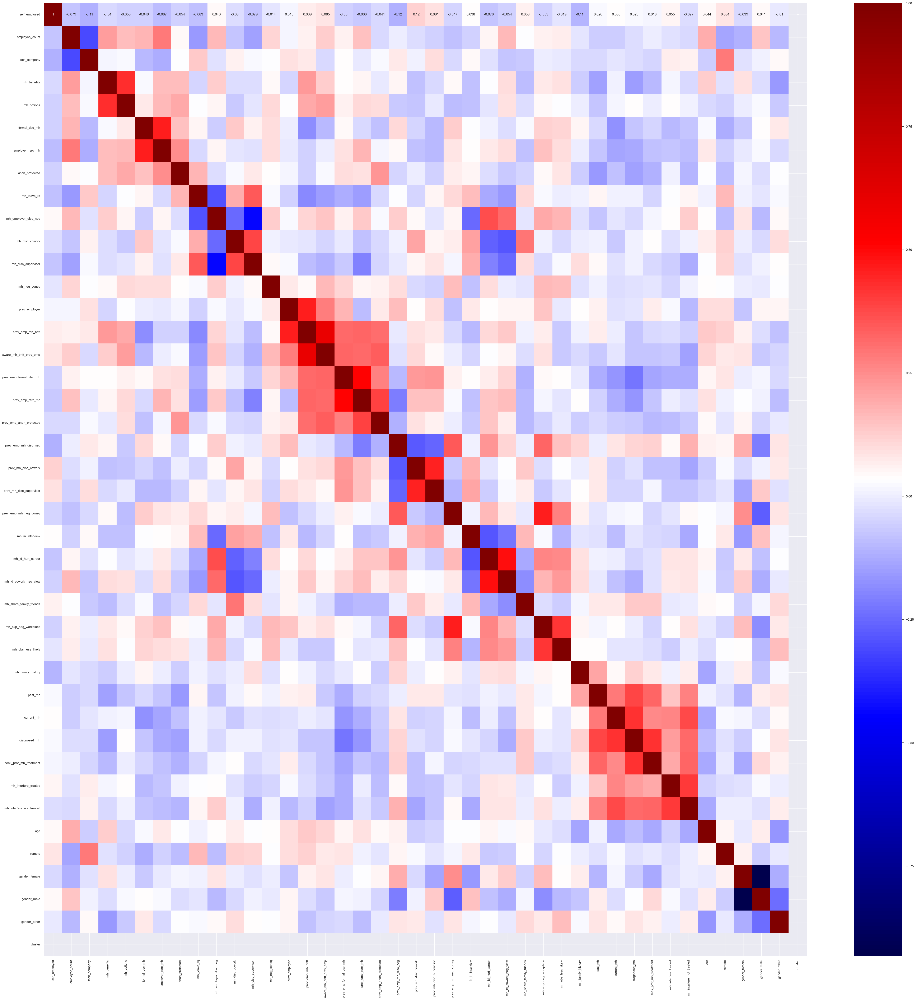

In [512]:
corr_mat = dfc_cluster_1.corr()

# generate heatmap

plt.figure(figsize=(48, 48))
sns.heatmap(corr_mat, annot=True, cmap='seismic')
plt.show()

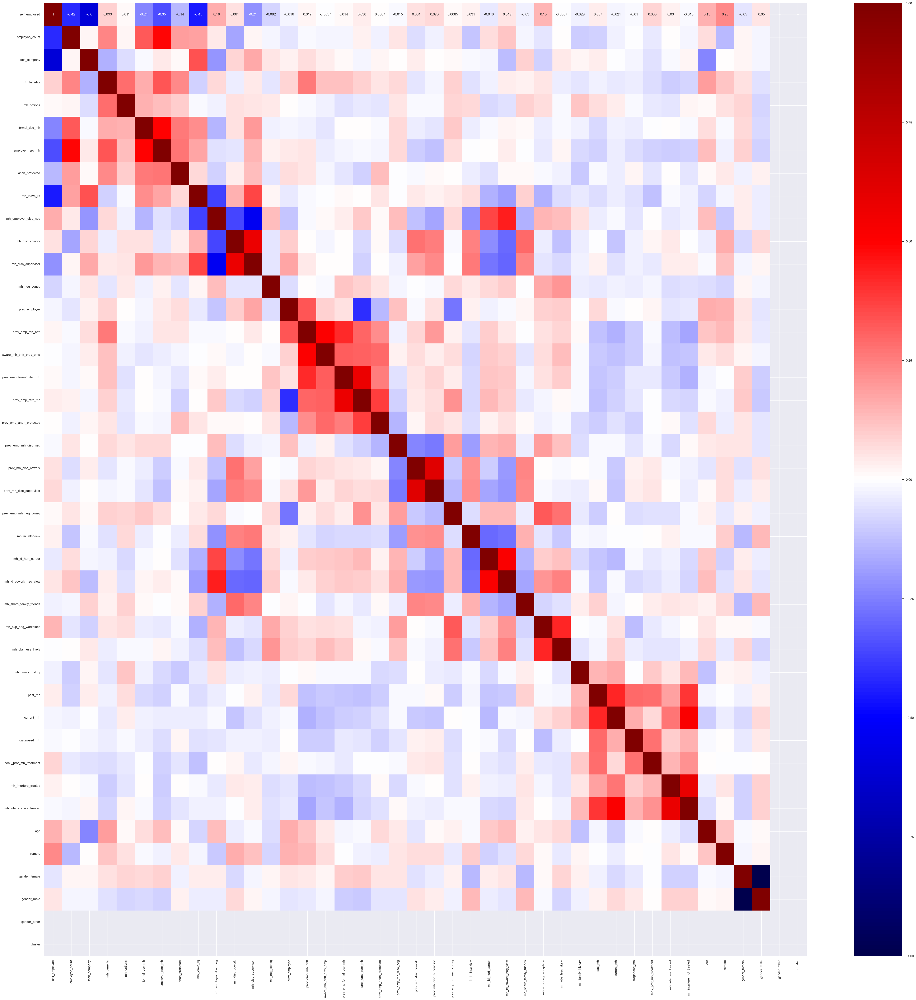

In [513]:
corr_mat = dfc_cluster_2.corr()

# generate heatmap

plt.figure(figsize=(48, 48))
sns.heatmap(corr_mat, annot=True, cmap='seismic')
plt.show()

# **6. Visualisations**

# **6.1 Cluster 0**

([<matplotlib.patches.Wedge at 0x35d0a21d0>,
 [Text(-0.7561668573919084, 0.798881520491021, 'Male'),
  Text(0.7111717669774094, -0.8391869385626956, 'Female'),
  Text(1.098341324697856, -0.06038488603085248, 'Other')],
 [Text(-0.4124546494864954, 0.435753556631466, '74.1%\n(1060)'),
  Text(0.3879118728967687, -0.4577383301251066, '24.1%\n(345)'),
  Text(0.5990952680170123, -0.032937210562283166, '1.7%\n(25)')])

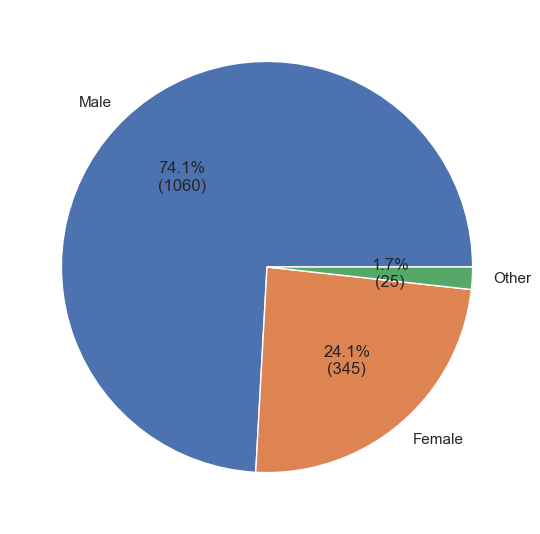

In [516]:
# Pie chart showing genders 
def autopct_format(values):
        def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return my_format

s = visuals_df['What is your gender?'].value_counts()
plt.pie(s,labels = s.index, autopct=autopct_format(s))

<Axes: title={'center': 'Past Mental Health Disorder'}, xlabel='What is your gender?', ylabel='count'>

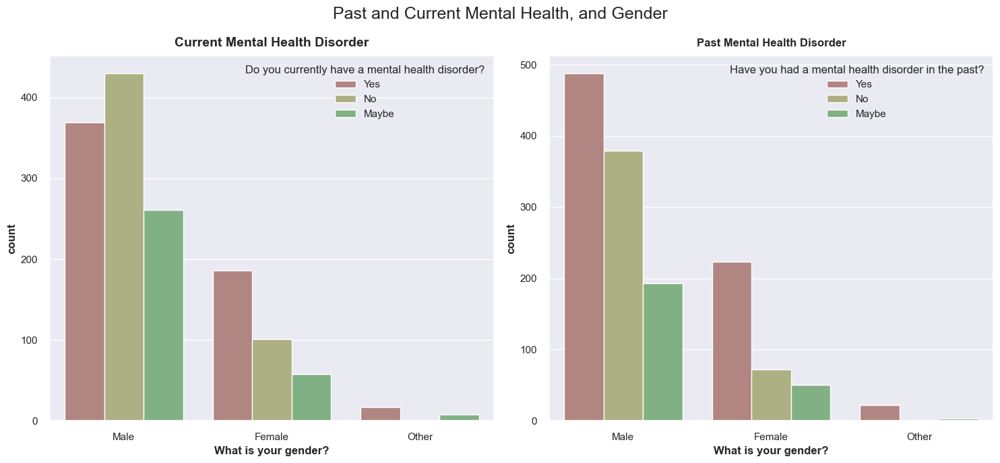

In [517]:
fig, ax = plt.subplots(1, 2, sharex=True, figsize=(15, 7))

fig.suptitle('Past and Current Mental Health, and Gender', fontsize = 18)
ax[0].set_title('Current Mental Health Disorder', pad = 10, fontsize = 14)
ax[1].set_title('Past Mental Health Disorder')

pal = sns.hls_palette(s=.3)
sns.countplot(ax=ax[0], x = visuals_df['What is your gender?'], 
              hue = visuals_df["Do you currently have a mental health disorder?"], 
              hue_order = ["Yes", "No", "Maybe"],
              palette = pal)
sns.countplot(ax=ax[1], x= visuals_df['What is your gender?'],
              hue = visuals_df["Have you had a mental health disorder in the past?"],
              hue_order = ["Yes", "No", "Maybe"],
              palette = pal)


([<matplotlib.patches.Wedge at 0x35d0a94d0>,
 [Text(-0.0012058000375083221, 1.0999993391117422, 'No'),
  Text(0.0012058000375076987, -1.0999993391117422, 'Yes')],
 [Text(-0.0006577091113681756, 0.5999996395154957, '50.0%\n(717)'),
  Text(0.0006577091113678357, -0.5999996395154957, '50.0%\n(716)')])

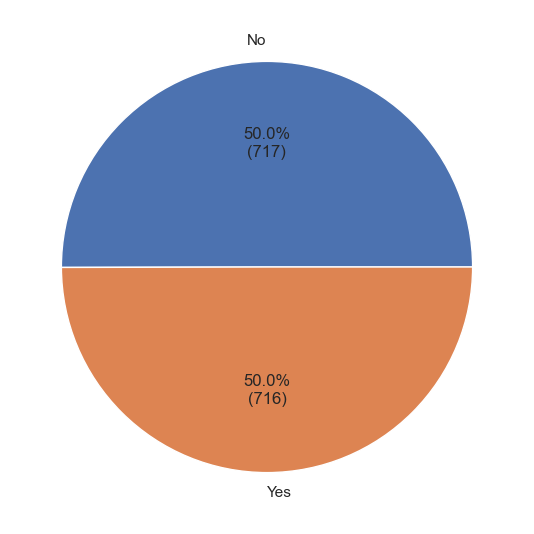

In [518]:
# Pie chart showing percentage of people with pereviously diagnosed mental health disorders
s = visuals_df['Have you been diagnosed with a mental health condition by a medical professional?'].value_counts()
plt.pie(s,labels = s.index, autopct=autopct_format(s))

<Axes: xlabel='What is your gender?', ylabel='count'>

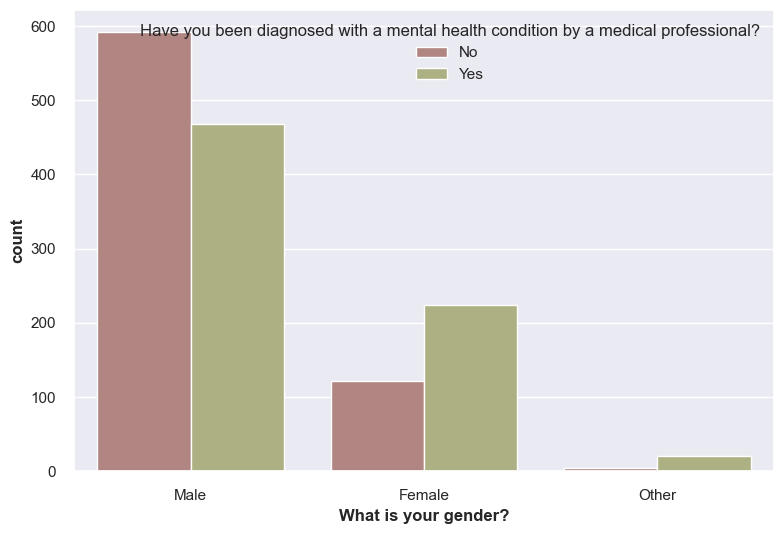

In [519]:
sns.countplot(x = visuals_df['What is your gender?'], 
              hue = visuals_df['Have you been diagnosed with a mental health condition by a medical professional?'], 
              hue_order = ["No", "Yes"],
              palette = pal)

<Axes: xlabel='Have you been diagnosed with a mental health condition by a medical professional?', ylabel='count'>

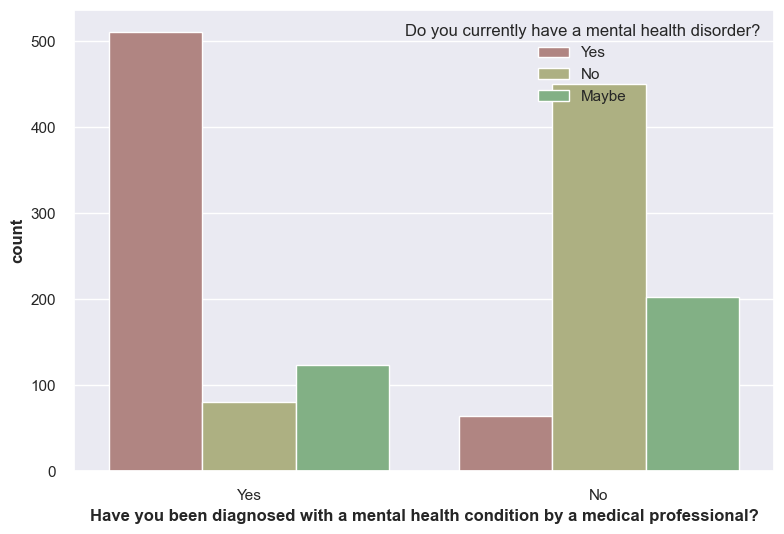

In [520]:
sns.countplot(x = visuals_df['Have you been diagnosed with a mental health condition by a medical professional?'], 
              hue = visuals_df['Do you currently have a mental health disorder?'], 
              hue_order = ["Yes", "No", "Maybe"],
              palette = pal)

<Axes: xlabel='Have you been diagnosed with a mental health condition by a medical professional?', ylabel='count'>

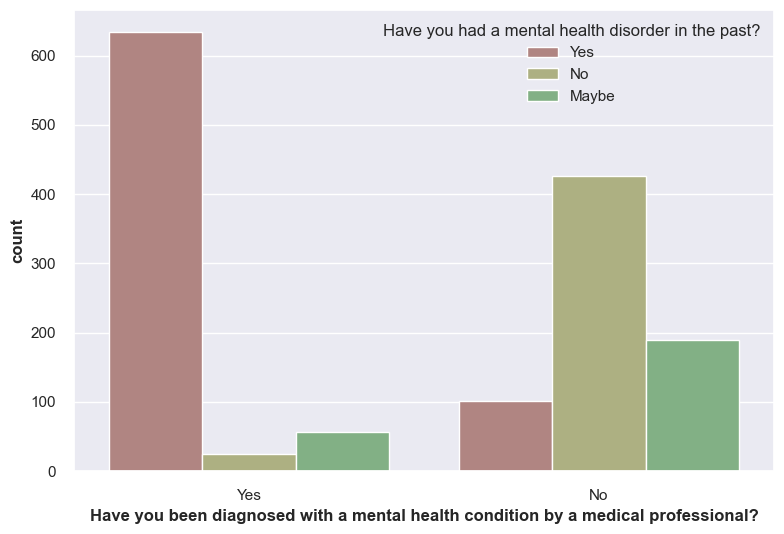

In [521]:
sns.countplot(x = visuals_df['Have you been diagnosed with a mental health condition by a medical professional?'], 
              hue = visuals_df['Have you had a mental health disorder in the past?'], 
              hue_order = ["Yes", "No", "Maybe"],
              palette = pal)

Object `workplace` not found.


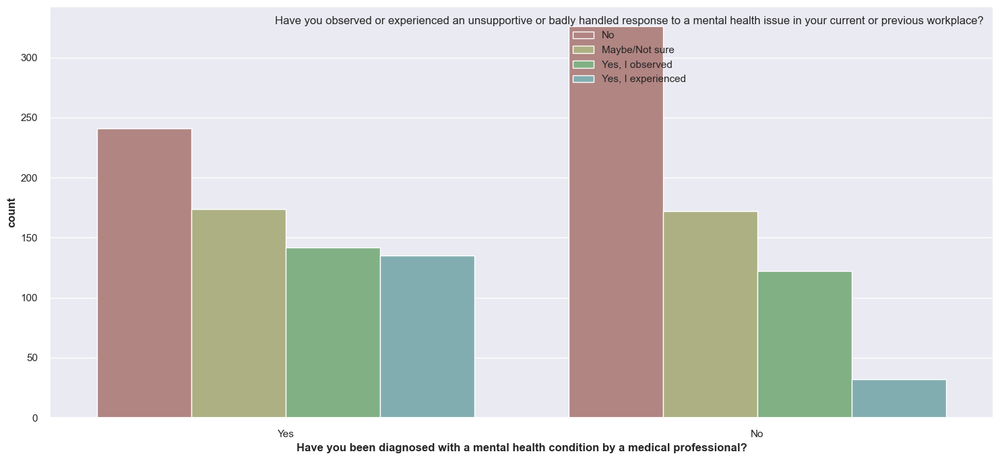

In [522]:
fig, ax = plt.subplots(figsize=(15,7))

sns.countplot(ax = ax,
              x = visuals_df['Have you been diagnosed with a mental health condition by a medical professional?'], 
              hue = visuals_df["Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?"], 
              hue_order = ["No", "Maybe/Not sure", "Yes, I observed", "Yes, I experienced"],
              palette = pal)

Have your observations of how another individual who discussed a mental health disorder made you less likely to reveal a mental health issue yourself in your current workplace?

<Axes: xlabel='Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?', ylabel='count'>

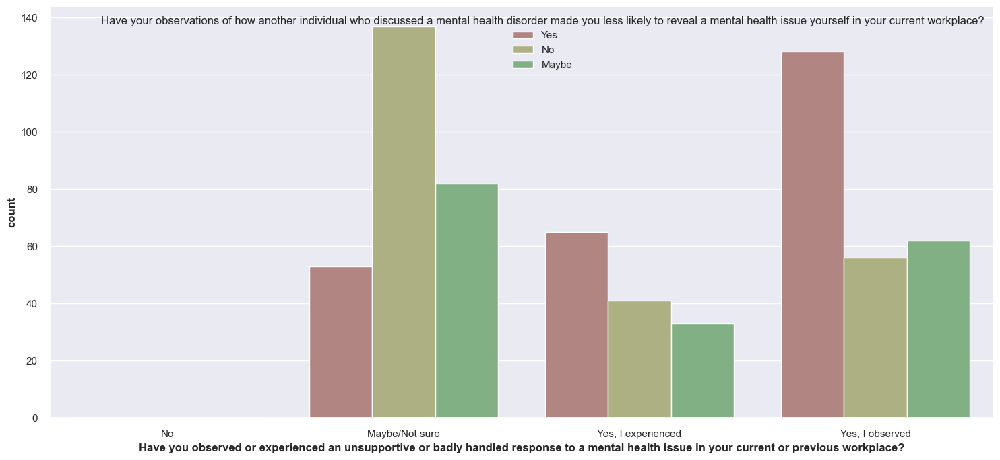

In [523]:
fig, ax = plt.subplots(figsize=(15,7))

sns.countplot(ax = ax,
              x = visuals_df['Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?'], 
              hue = visuals_df["Have your observations of how another individual who discussed a mental health disorder made you less likely to reveal a mental health issue yourself in your current workplace?"], 
              hue_order = ["Yes", "No", "Maybe"],
              palette = pal)

<Axes: title={'center': 'Past Employer'}, xlabel='Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?', ylabel='count'>

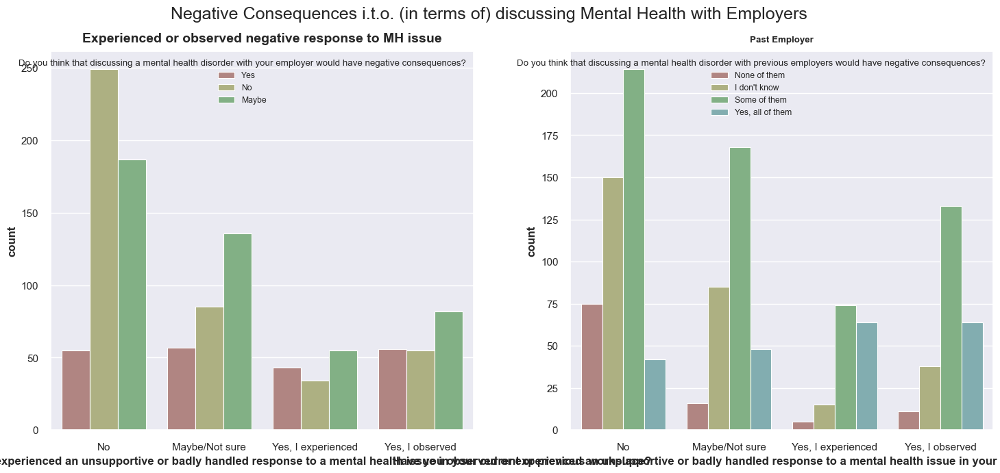

In [524]:
fig, ax = plt.subplots(1, 2, sharex=True, figsize=(15, 7))
sns.set_context("paper", rc={"figure.figsize": (8, 6)})

fig.suptitle('Negative Consequences i.t.o. (in terms of) discussing Mental Health with Employers', fontsize = 18)
ax[0].set_title('Experienced or observed negative response to MH issue', pad = 10, fontsize = 14)
ax[1].set_title('Past Employer')

pal = sns.hls_palette(s=.3)
sns.countplot(ax=ax[0], x = visuals_df['Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?'], 
              hue = visuals_df["Do you think that discussing a mental health disorder with your employer would have negative consequences?"], 
              hue_order = ["Yes", "No", "Maybe"],
              palette = pal)
sns.countplot(ax=ax[1], x= visuals_df["Have you observed or experienced an unsupportive or badly handled response to a mental health issue in your current or previous workplace?"],
              hue = visuals_df["Do you think that discussing a mental health disorder with previous employers would have negative consequences?"],
              hue_order = ["None of them", "I don't know", "Some of them", "Yes, all of them"],
              palette = pal)

<Axes: xlabel='Would you bring up a mental health issue with a potential employer in an interview?', ylabel='count'>

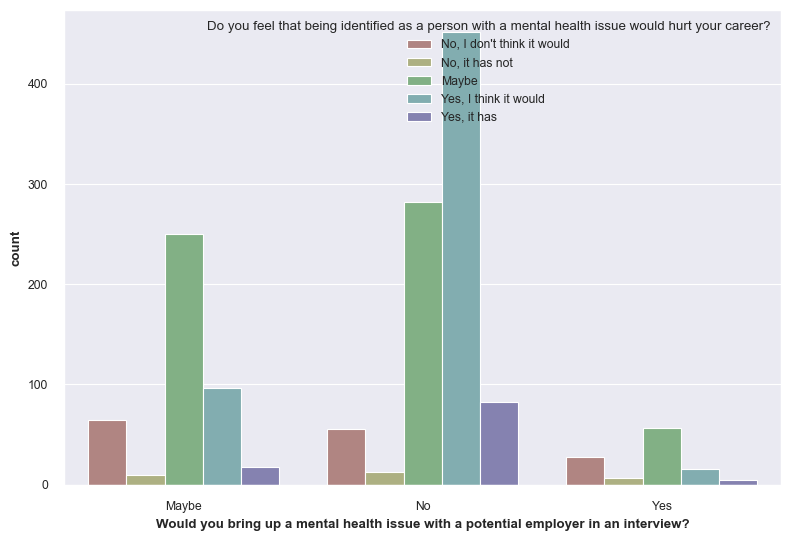

In [525]:
sns.countplot(x = visuals_df['Would you bring up a mental health issue with a potential employer in an interview?'], 
              hue = visuals_df['Do you feel that being identified as a person with a mental health issue would hurt your career?'], 
              hue_order = ["No, I don't think it would", "No, it has not", "Maybe", "Yes, I think it would", "Yes, it has"],
              palette = pal)

<Axes: xlabel='Do you have a family history of mental illness?', ylabel='count'>

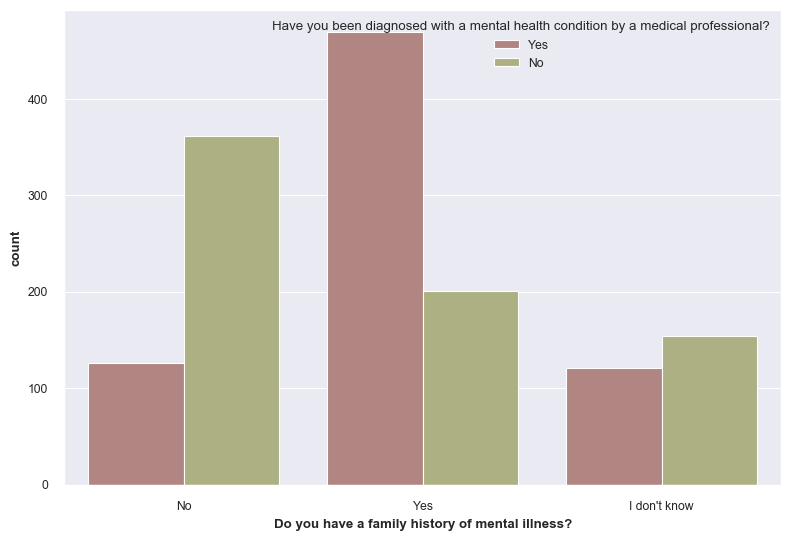

In [526]:
sns.countplot(x = visuals_df['Do you have a family history of mental illness?'], 
              hue = visuals_df["Have you been diagnosed with a mental health condition by a medical professional?"], 
              hue_order = ["Yes", "No"],
              palette = pal)

# **6.2 Cluster 1**

([<matplotlib.patches.Wedge at 0x3601d3810>,
 [Text(0.28032941976648673, 1.0636801288044189, 'Maybe'),
  Text(-0.9324264912644843, -0.58359304175787, 'No'),
  Text(0.8019481253350291, -0.7529138093245684, 'Yes')],
 [Text(0.1529069562362655, 0.5801891611660466, '41.8%\n(479)'),
  Text(-0.508596267962446, -0.31832347732247446, '34.2%\n(392)'),
  Text(0.4374262501827431, -0.4106802596315828, '24.0%\n(275)')])

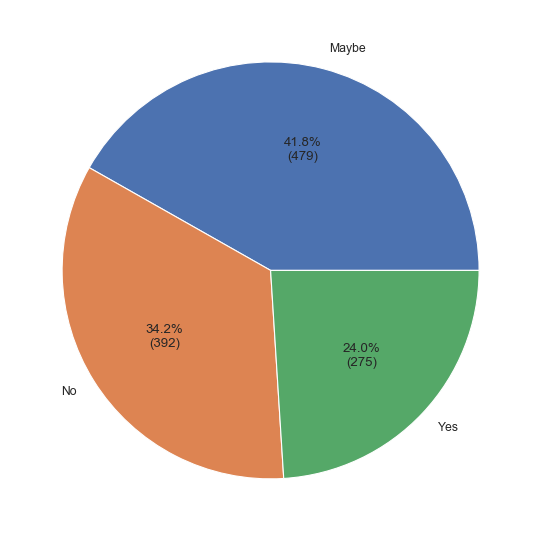

In [528]:
def autopct_format(values):
        def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return my_format

s = visuals_df['Would you feel comfortable discussing a mental health disorder with your coworkers?'].value_counts()
plt.pie(s,labels = s.index, autopct=autopct_format(s))

([<matplotlib.patches.Wedge at 0x3600852d0>,
 [Text(0.42582229500478835, 1.0142363497118683, 'Yes'),
  Text(-1.0652010674961454, -0.27449350776488807, 'Maybe'),
  Text(0.6654434061321345, -0.8758910167568014, 'No')],
 [Text(0.23226670636624816, 0.5532198271155644, '37.3%\n(428)'),
  Text(-0.5810187640888065, -0.14972373150812074, '33.3%\n(382)'),
  Text(0.36296913061752784, -0.4777587364128007, '29.3%\n(336)')])

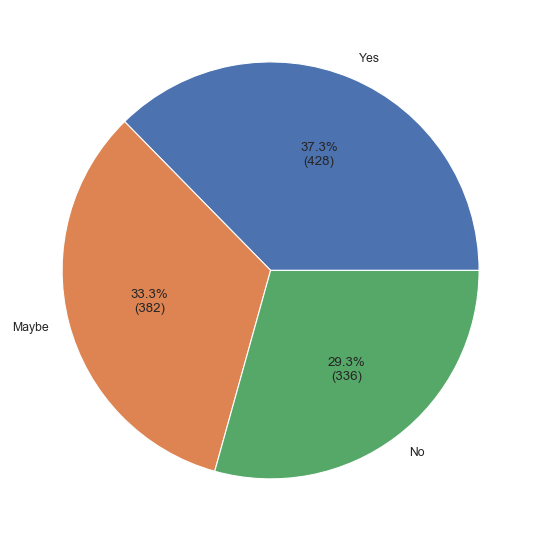

In [529]:

s = visuals_df['Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?'].value_counts()
plt.pie(s,labels = s.index, autopct=autopct_format(s))

In [530]:

visuals_df[["Do you think that discussing a mental health disorder with your employer would have negative consequences?"]].value_counts()

Do you think that discussing a mental health disorder with your employer would have negative consequences?
Maybe                                                                                                         487
No                                                                                                            438
Yes                                                                                                           221
Name: count, dtype: int64

<Axes: title={'center': 'Employer Offers resources'}, xlabel='Does your employer offer resources to learn more about mental health concerns and options for seeking help?', ylabel='count'>

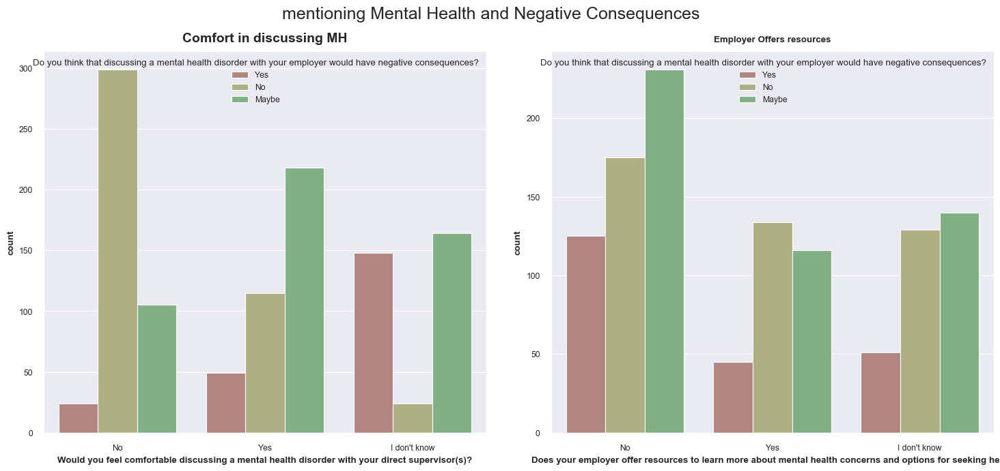

In [531]:

fig, ax = plt.subplots(1, 2, sharex=True, figsize=(15, 7))
sns.set_context("paper", rc={"figure.figsize": (8, 6)})

fig.suptitle('mentioning Mental Health and Negative Consequences', fontsize = 18)
ax[0].set_title('Comfort in discussing MH', pad = 10, fontsize = 14)
ax[1].set_title('Employer Offers resources')

pal = sns.hls_palette(s=.3)
sns.countplot(ax=ax[0], x = visuals_df['Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?'], 
              hue = visuals_df["Do you think that discussing a mental health disorder with your employer would have negative consequences?"], 
              hue_order = ["Yes", "No", "Maybe"],
              palette = pal)
sns.countplot(ax=ax[1], x= visuals_df["Does your employer offer resources to learn more about mental health concerns and options for seeking help?"],
              hue = visuals_df["Do you think that discussing a mental health disorder with your employer would have negative consequences?"],
              hue_order = ["Yes", "No", "Maybe"],
              palette = pal)

<Axes: xlabel='Does your employer offer resources to learn more about mental health concerns and options for seeking help?', ylabel='count'>

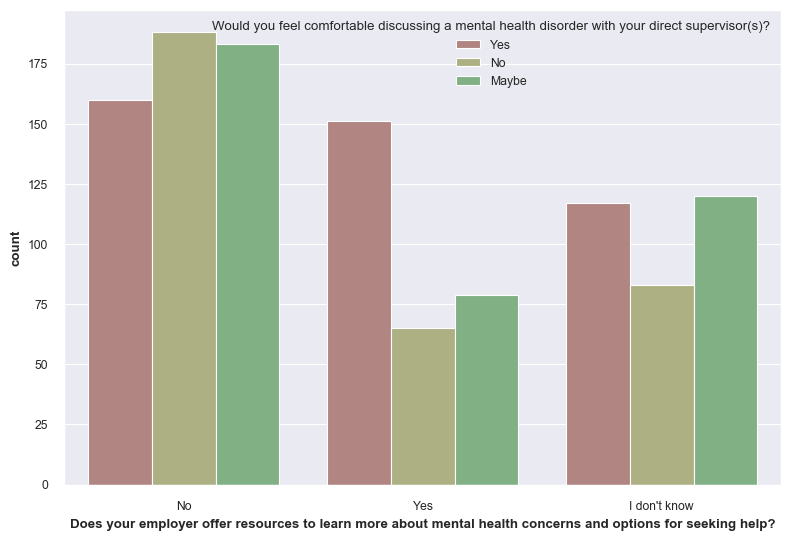

In [532]:
sns.countplot(x = visuals_df['Does your employer offer resources to learn more about mental health concerns and options for seeking help?'], 
              hue = visuals_df["Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?"], 
              hue_order = ["Yes", "No", "Maybe"],
              palette = pal)

<Axes: xlabel='Do you think that team members/co-workers would view you more negatively if they knew you suffered from a mental health issue?', ylabel='count'>

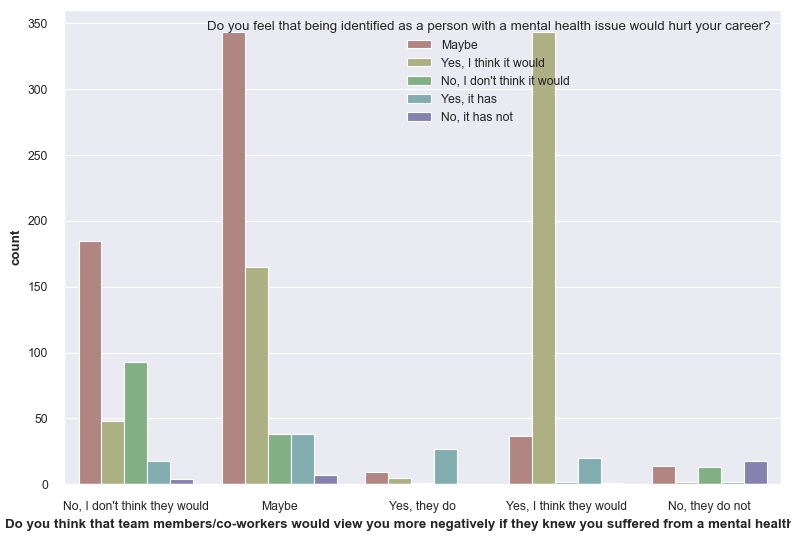

In [533]:

sns.countplot(x = visuals_df['Do you think that team members/co-workers would view you more negatively if they knew you suffered from a mental health issue?'], 
              hue = visuals_df["Do you feel that being identified as a person with a mental health issue would hurt your career?"], 
              hue_order = ["Maybe", "Yes, I think it would", "No, I don't think it would", "Yes, it has", "No, it has not"],
              palette = pal)

<Axes: xlabel='If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:', ylabel='count'>

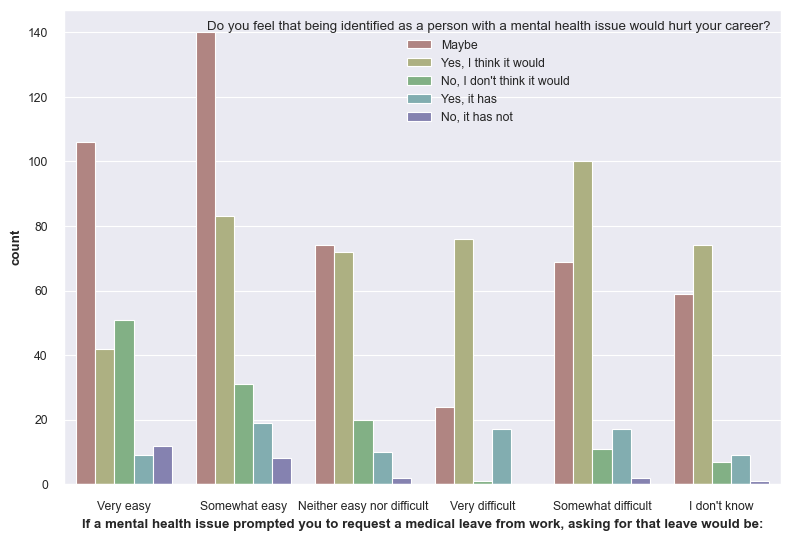

In [534]:
sns.countplot(x = visuals_df['If a mental health issue prompted you to request a medical leave from work, asking for that leave would be:'], 
              hue = visuals_df["Do you feel that being identified as a person with a mental health issue would hurt your career?"], 
              hue_order = ["Maybe", "Yes, I think it would", "No, I don't think it would", "Yes, it has", "No, it has not"],
              palette = pal)

<Axes: xlabel='Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?', ylabel='count'>

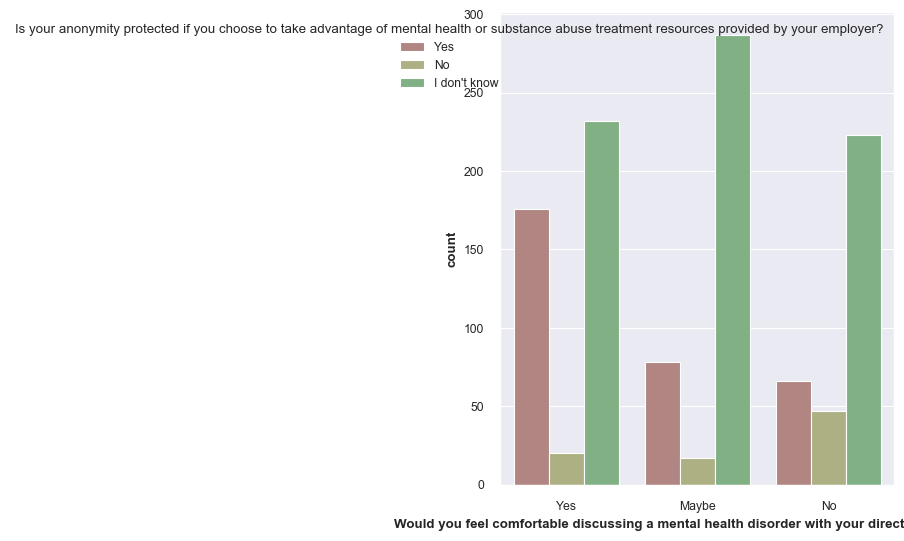

In [535]:
pal = sns.hls_palette(s=.3)
sns.countplot(x = visuals_df['Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?'], 
              hue = visuals_df["Is your anonymity protected if you choose to take advantage of mental health or substance abuse treatment resources provided by your employer?"], 
              hue_order = ["Yes", "No", "I don't know"],
              palette = pal)

<Axes: xlabel='Do you feel that being identified as a person with a mental health issue would hurt your career?', ylabel='count'>

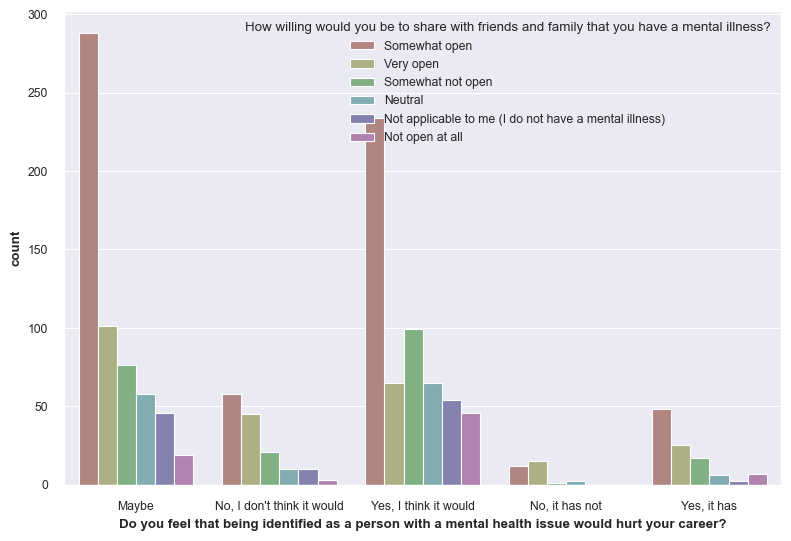

In [536]:
sns.set_context("paper", rc={"figure.figsize": (10, 10)})

sns.countplot(x = visuals_df['Do you feel that being identified as a person with a mental health issue would hurt your career?'], 
              hue = visuals_df['How willing would you be to share with friends and family that you have a mental illness?'], 
              hue_order = ["Somewhat open", "Very open", "Somewhat not open", "Neutral", "Not applicable to me (I do not have a mental illness)","Not open at all"],
              palette = pal)

<Axes: xlabel='Do you feel that being identified as a person with a mental health issue would hurt your career?', ylabel='count'>

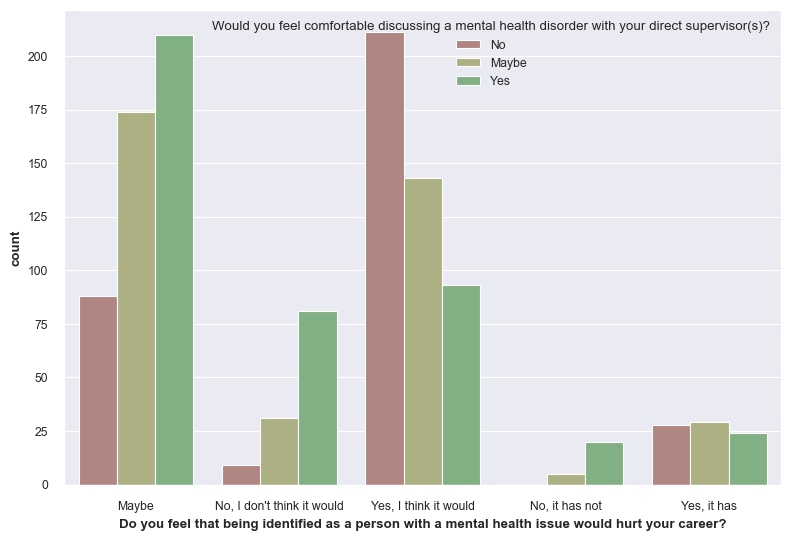

In [537]:

sns.countplot(x= visuals_df['Do you feel that being identified as a person with a mental health issue would hurt your career?'],
              hue = visuals_df["Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?"],
              hue_order = ["No", "Maybe", "Yes"],
              palette = pal)

In [538]:
visuals_df[["Does your employer provide mental health benefits as part of healthcare coverage?"]].value_counts()

Does your employer provide mental health benefits as part of healthcare coverage?
Yes                                                                                  531
I don't know                                                                         319
No                                                                                   213
Not eligible for coverage / N/A                                                       83
Name: count, dtype: int64

<Axes: xlabel='Do you feel that being identified as a person with a mental health issue would hurt your career?', ylabel='count'>

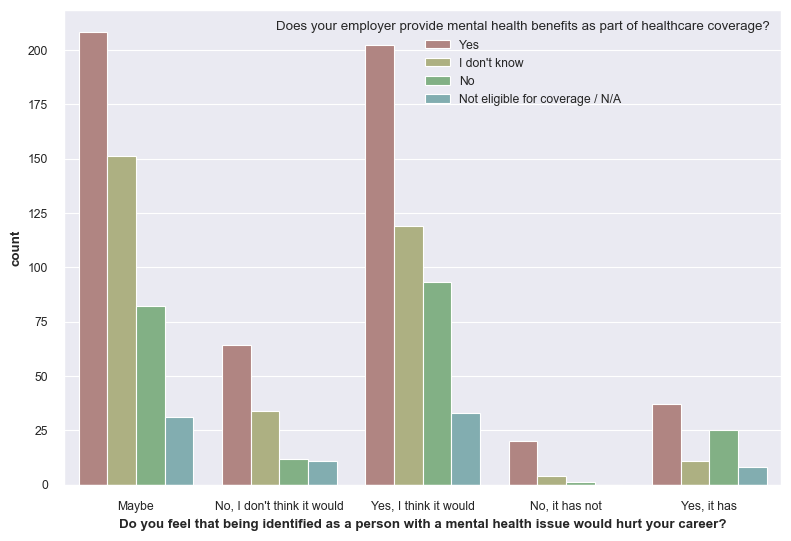

In [539]:
sns.countplot(x= visuals_df['Do you feel that being identified as a person with a mental health issue would hurt your career?'],
              hue = visuals_df["Does your employer provide mental health benefits as part of healthcare coverage?"],
              hue_order = ["Yes", "I don't know", "No", "Not eligible for coverage / N/A"],
              palette = pal)

<Axes: xlabel='Do you think that discussing a mental health disorder with your employer would have negative consequences?', ylabel='count'>

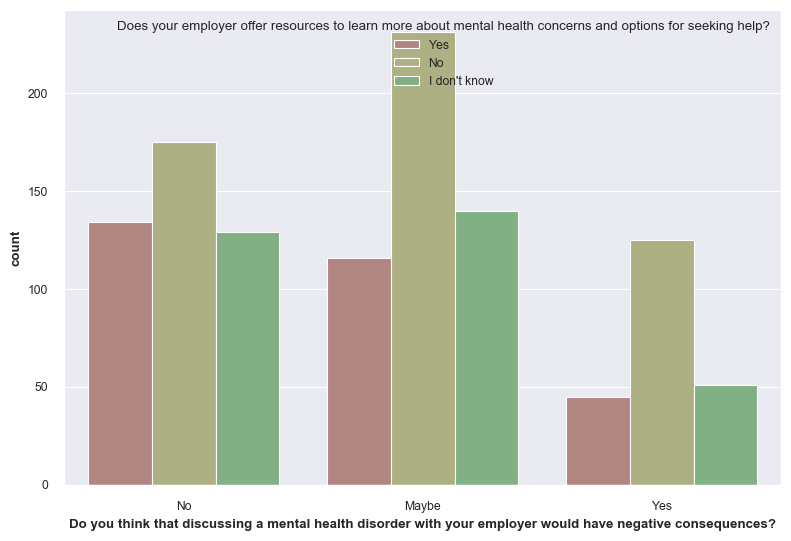

In [540]:
sns.countplot(x = visuals_df['Do you think that discussing a mental health disorder with your employer would have negative consequences?'], 
              hue = visuals_df["Does your employer offer resources to learn more about mental health concerns and options for seeking help?"], 
              hue_order = ["Yes", "No", "I don't know"],
              palette = pal)

# **6.3 Cluster 2**

([<matplotlib.patches.Wedge at 0x3670460d0>,
 [Text(-0.8893513988864181, 0.6473438725274006, '0'),
  Text(0.8893514291907708, -0.6473438308938564, '1')],
 [Text(-0.4851007630289553, 0.3530966577422185, '80.0%\n(1146)'),
  Text(0.4851007795586022, -0.35309663503301253, '20.0%\n(287)')])

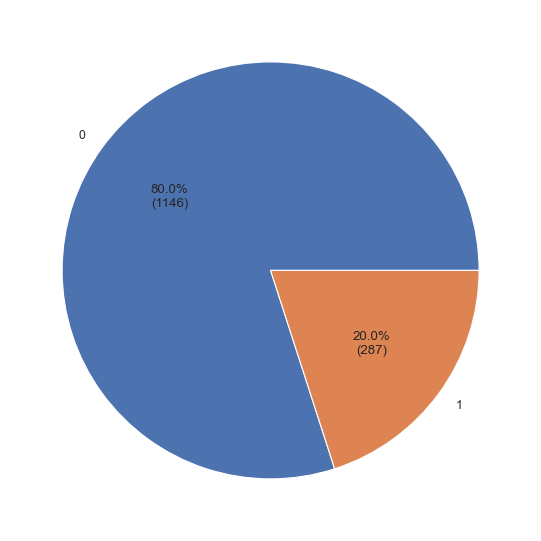

In [542]:

s = visuals_df['Are you self-employed?'].value_counts()
plt.pie(s,labels = s.index, autopct=autopct_format(s))

How many employees does your company or organization have?
26-100            292
More than 1000    256
100-500           248
6-25              210
500-1000           80
1-5                60
Name: count, dtype: int64

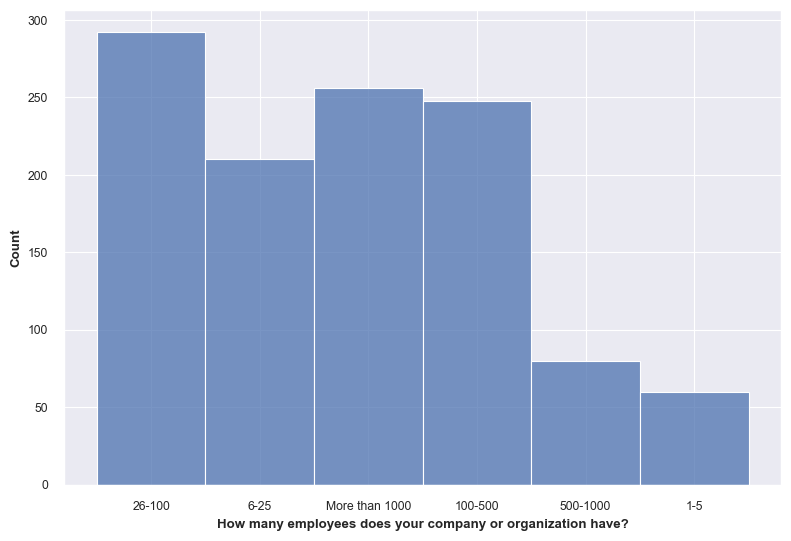

In [543]:
# plot gender 
fig1 = sns.histplot(visuals_df['How many employees does your company or organization have?'])
visuals_df['How many employees does your company or organization have?'].value_counts()

<Axes: title={'center': 'Direct Supervisor'}, xlabel='Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?', ylabel='count'>

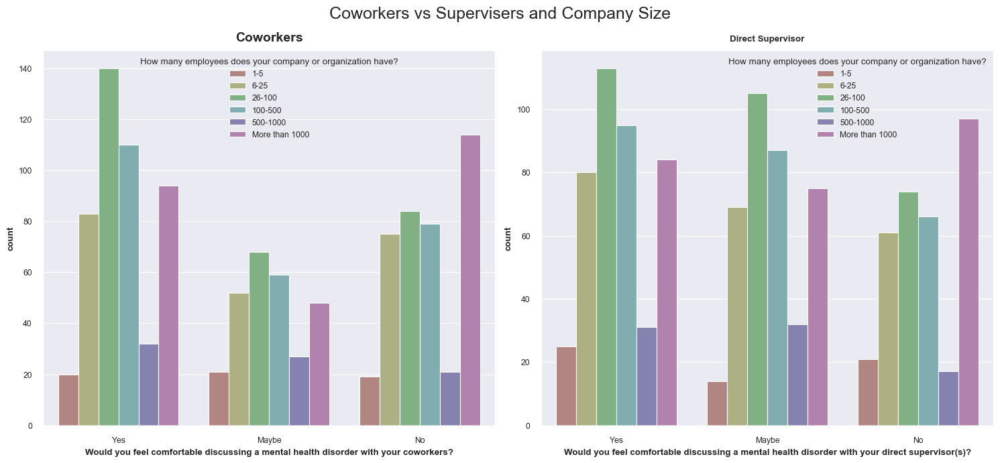

In [544]:
fig, ax = plt.subplots(1, 2, sharex=True, figsize=(15, 7))

fig.suptitle('Coworkers vs Supervisers and Company Size', fontsize = 18)
ax[0].set_title('Coworkers', pad = 10, fontsize = 14)
ax[1].set_title('Direct Supervisor')

pal = sns.hls_palette(s=.3)
sns.countplot(ax=ax[0], x = visuals_df['Would you feel comfortable discussing a mental health disorder with your coworkers?'], 
              hue = visuals_df["How many employees does your company or organization have?"], 
              hue_order = ["1-5", "6-25", "26-100", "100-500", "500-1000", "More than 1000"],
              palette = pal)
sns.countplot(ax=ax[1], x= visuals_df['Would you feel comfortable discussing a mental health disorder with your direct supervisor(s)?'],
              hue = visuals_df["How many employees does your company or organization have?"],
              hue_order = ["1-5", "6-25", "26-100", "100-500","500-1000", "More than 1000"],
              palette = pal)

<Axes: xlabel='Does your employer offer resources to learn more about mental health concerns and options for seeking help?', ylabel='count'>

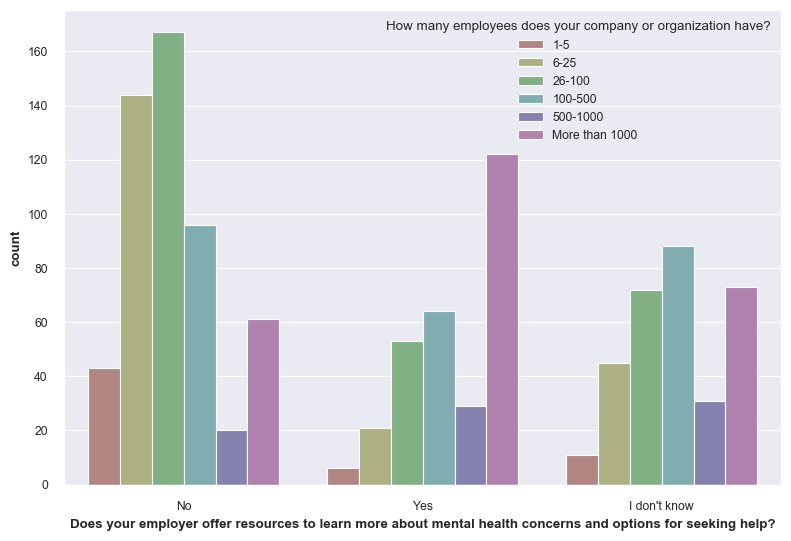

In [545]:
sns.set_context("paper", rc={"figure.figsize": (8, 6)})

sns.countplot(x = visuals_df['Does your employer offer resources to learn more about mental health concerns and options for seeking help?'], 
              hue = visuals_df["How many employees does your company or organization have?"], 
              hue_order = ["1-5", "6-25", "26-100", "100-500", "500-1000", "More than 1000"],
              palette = pal)

<Axes: xlabel='Do you feel that being identified as a person with a mental health issue would hurt your career?', ylabel='count'>

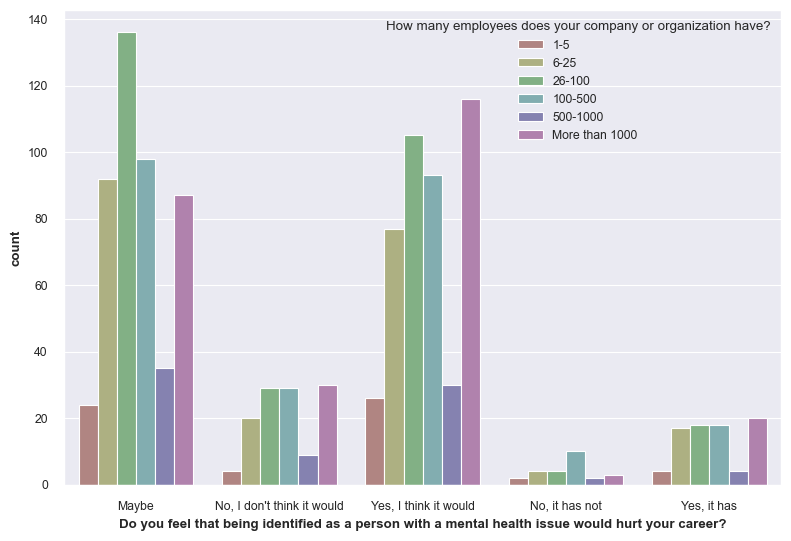

In [546]:
sns.set_context("paper", rc={"figure.figsize": (8, 6)})

sns.countplot(x = visuals_df['Do you feel that being identified as a person with a mental health issue would hurt your career?'], 
              hue = visuals_df["How many employees does your company or organization have?"], 
              hue_order = ["1-5", "6-25", "26-100", "100-500", "500-1000", "More than 1000"],
              palette = pal)

<Axes: xlabel='Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?', ylabel='count'>

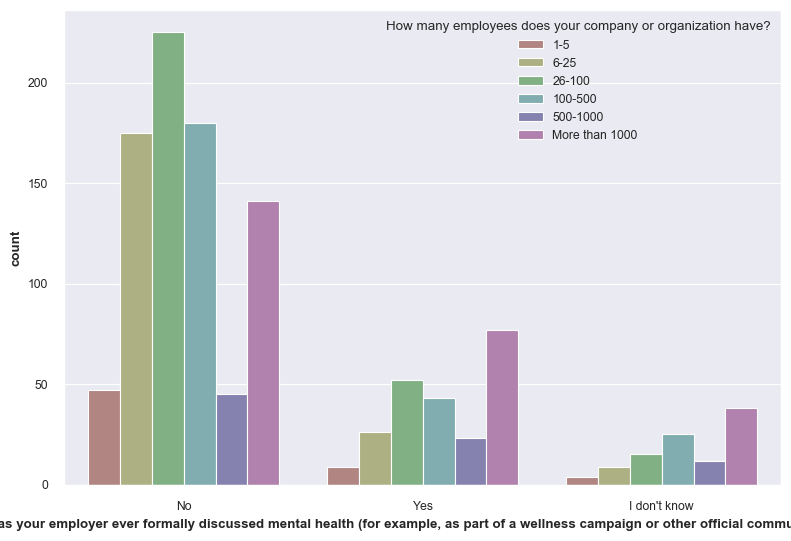

In [547]:
sns.set_context("paper", rc={"figure.figsize": (8, 6)})

sns.countplot(x = visuals_df['Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?'], 
              hue = visuals_df["How many employees does your company or organization have?"], 
              hue_order = ["1-5", "6-25", "26-100", "100-500", "500-1000", "More than 1000"],
              palette = pal)

<Axes: xlabel='Do you feel that being identified as a person with a mental health issue would hurt your career?', ylabel='count'>

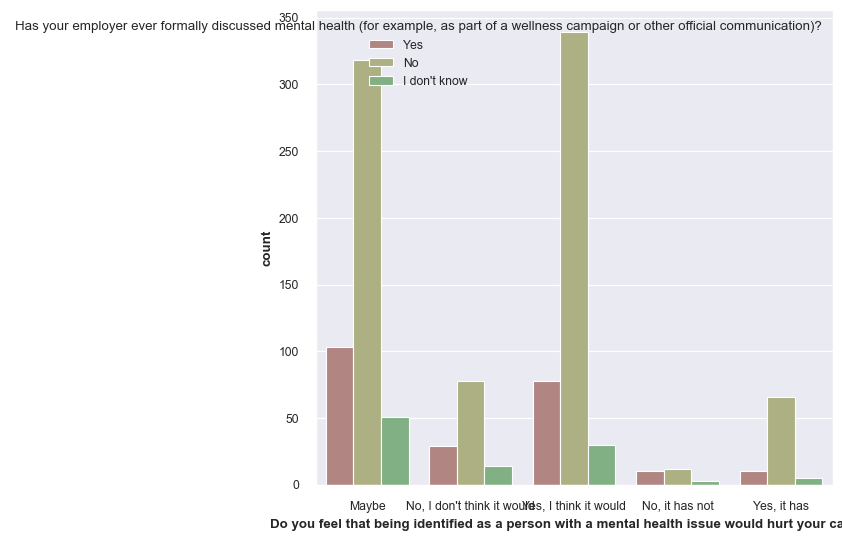

In [548]:
sns.set_context("paper", rc={"figure.figsize": (10, 10)})

sns.countplot(x = visuals_df['Do you feel that being identified as a person with a mental health issue would hurt your career?'], 
              hue = visuals_df["Has your employer ever formally discussed mental health (for example, as part of a wellness campaign or other official communication)?"], 
              hue_order = ["Yes", "No", "I don't know"],
              palette = pal)

<Axes: title={'center': 'Direct Supervisor'}, xlabel='Would you bring up a mental health issue with a potential employer in an interview?', ylabel='count'>

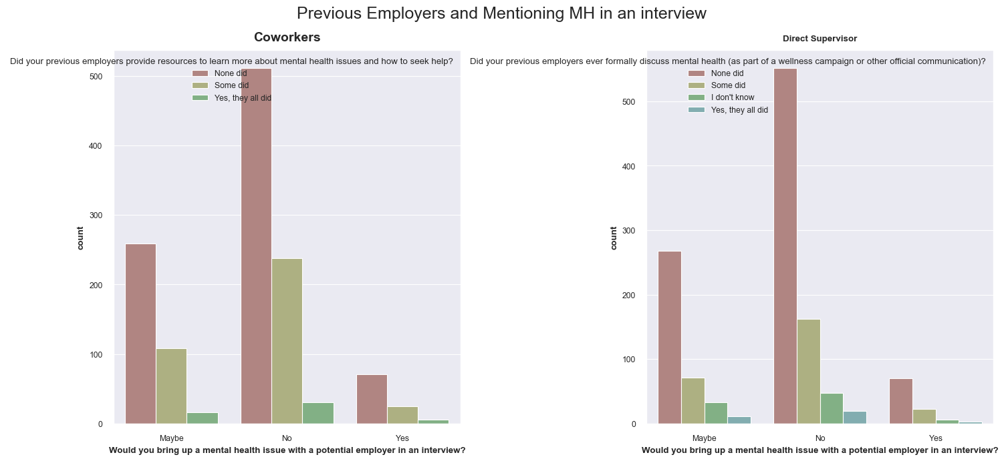

In [549]:
fig, ax = plt.subplots(1, 2, sharex=True, figsize=(15, 7))

fig.suptitle('Previous Employers and Mentioning MH in an interview', fontsize = 18)
ax[0].set_title('Coworkers', pad = 10, fontsize = 14)
ax[1].set_title('Direct Supervisor')

pal = sns.hls_palette(s=.3)
sns.countplot(ax=ax[0], x = visuals_df['Would you bring up a mental health issue with a potential employer in an interview?'], 
              hue = visuals_df["Did your previous employers provide resources to learn more about mental health issues and how to seek help?"], 
              hue_order = ["None did", "Some did", "Yes, they all did"],
              palette = pal)
sns.countplot(ax=ax[1], x= visuals_df['Would you bring up a mental health issue with a potential employer in an interview?'],
              hue = visuals_df["Did your previous employers ever formally discuss mental health (as part of a wellness campaign or other official communication)?"],
              hue_order = ["None did", "Some did", "I don't know", "Yes, they all did"],
              palette = pal)

In [550]:


visuals_df[["How many employees does your company or organization have?"]].value_counts()

How many employees does your company or organization have?
26-100                                                        292
More than 1000                                                256
100-500                                                       248
6-25                                                          210
500-1000                                                       80
1-5                                                            60
Name: count, dtype: int64

<Axes: xlabel='How many employees does your company or organization have?', ylabel='count'>

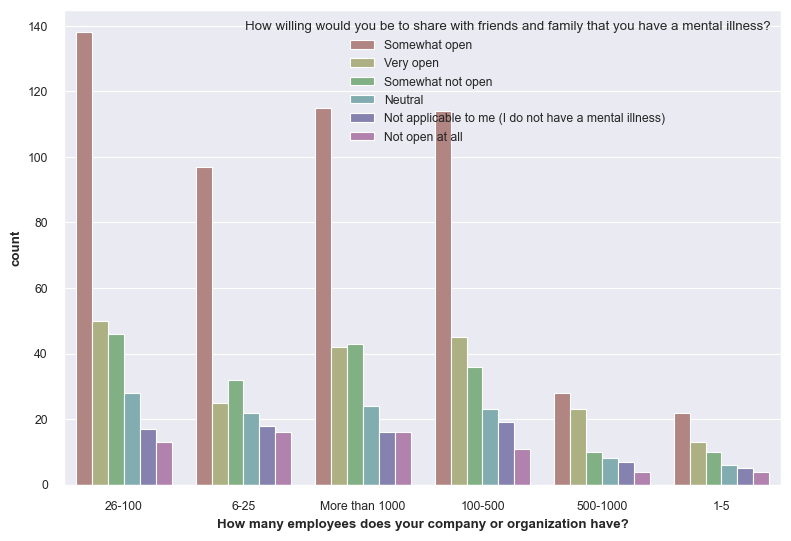

In [551]:
sns.set_context("paper", rc={"figure.figsize": (8, 6)})

sns.countplot(x = visuals_df['How many employees does your company or organization have?'], 
              hue = visuals_df["How willing would you be to share with friends and family that you have a mental illness?"], 
              hue_order = ["Somewhat open", "Very open", "Somewhat not open", "Neutral", "Not applicable to me (I do not have a mental illness)", "Not open at all"],
              palette = pal)

<Axes: xlabel='Do you think that discussing a mental health disorder with your employer would have negative consequences?', ylabel='count'>

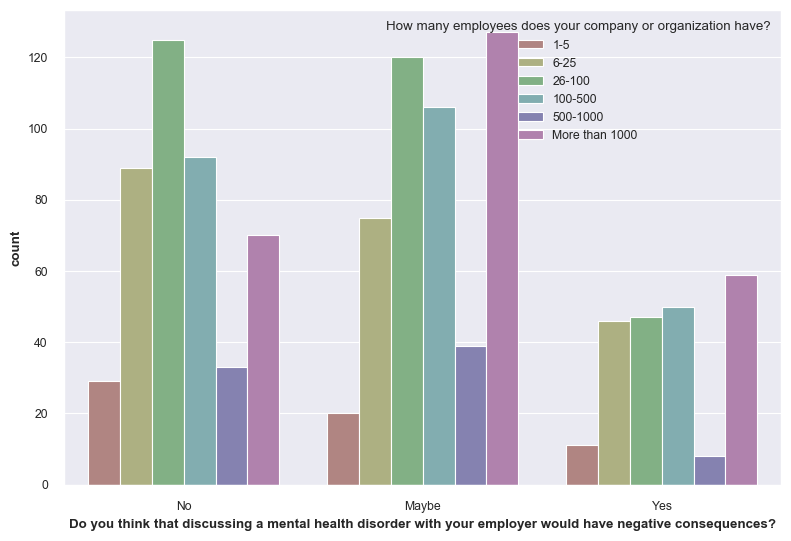

In [552]:
sns.set_context("paper", rc={"figure.figsize": (8, 6)})

sns.countplot(x = visuals_df['Do you think that discussing a mental health disorder with your employer would have negative consequences?'], 
              hue = visuals_df["How many employees does your company or organization have?"], 
              hue_order = ["1-5", "6-25", "26-100", "100-500", "500-1000", "More than 1000"],
              palette = pal)
